# Diabetic Retinopathy Debrecen — Executed Exploratory Analysis

This notebook accompanies the reproducible `main.py` pipeline. Per UCI metadata, `class=1` means signs of diabetic retinopathy and `class=0` means no signs. Results classify this dataset label; they are not a clinically validated diagnosis.

In [1]:
from pathlib import Path
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Image

ROOT = Path.cwd().parent if Path.cwd().name == 'notebooks' else Path.cwd()
sys.path.insert(0, str(ROOT))
from src.data_loader import load_dataset
from src.statistical_analysis import descriptive_statistics, quality_analysis
from src.preprocessing import make_split

DATA = ROOT / 'data' / 'Retinopathy_Debrecen.csv'
TABLES = ROOT / 'outputs' / 'tables'
FIGURES = ROOT / 'outputs' / 'figures'
df, X, y = load_dataset(DATA)
print(f'Loaded {DATA.name}: {df.shape[0]} observations, {X.shape[1]} predictors, 1 target')

Loaded Retinopathy_Debrecen.csv: 1151 observations, 18 predictors, 1 target


## 1. Dataset loading and validation

In [2]:
print('Shape:', df.shape)
print('Observations:', len(df))
print('Predictors:', X.shape[1])
print('Columns:', df.columns.tolist())
print('Target semantics: 0 = no signs of DR; 1 = contains signs of DR')
display(df.head())

Shape: (1151, 19)
Observations: 1151
Predictors: 18
Columns: ['quality', 'pre_screening', 'ma1', 'ma2', 'ma3', 'ma4', 'ma5', 'ma6', 'exudate1', 'exudate2', 'exudate3', 'exudate5', 'exudate6', 'exudate7', 'exudate8', 'macula_opticdisc_distance', 'opticdisc_diameter', 'am_fm_classification', 'class']
Target semantics: 0 = no signs of DR; 1 = contains signs of DR


,quality,pre_screening,ma1,ma2,ma3,ma4,ma5,ma6,exudate1,exudate2,exudate3,exudate5,exudate6,exudate7,exudate8,macula_opticdisc_distance,opticdisc_diameter,am_fm_classification,class
0,1,1,22,22,22,19,18,14,49.895756,17.775994,5.270920,0.018632,0.006864,0.003923,0.003923,0.486903,0.100025,1,0
1,1,1,24,24,22,18,16,13,57.709936,23.799994,3.325423,0.003903,0.003903,0.003903,0.003903,0.520908,0.144414,0,0
2,1,1,62,60,59,54,47,33,55.831441,27.993933,12.687485,1.393889,0.373252,0.041817,0.007744,0.530904,0.128548,0,1
3,1,1,55,53,53,50,43,31,40.467228,18.445954,9.118901,0.840261,0.272434,0.007653,0.001531,0.483284,0.114790,0,0
4,1,1,44,44,44,41,39,27,18.026254,8.570709,0.410381,0.000000,0.000000,0.000000,0.000000,0.475935,0.123572,0,1


In [3]:
print('Last five rows:')
display(df.tail())
print('Data types:')
display(df.dtypes.rename('dtype').to_frame())

Last five rows:


,quality,pre_screening,ma1,ma2,ma3,ma4,ma5,ma6,exudate1,exudate2,exudate3,exudate5,exudate6,exudate7,exudate8,macula_opticdisc_distance,opticdisc_diameter,am_fm_classification,class
1146,1,1,34,34,34,33,31,24,6.071765,0.937472,0.031145,0.000000,0.000000,0.000000,0.000000,0.537470,0.116795,0,0
1147,1,1,49,49,49,49,45,37,63.197145,27.377668,8.067688,0.001552,0.000000,0.000000,0.000000,0.516733,0.124190,0,0
1148,1,0,49,48,48,45,43,33,30.461898,13.966980,1.763305,0.011221,0.000000,0.000000,0.000000,0.560632,0.129843,0,0
1149,1,1,39,36,29,23,13,7,40.525739,12.604947,4.740919,0.563518,0.326860,0.239568,0.174584,0.485972,0.106690,1,1
1150,1,1,7,7,7,7,7,5,69.423565,7.031843,1.750548,0.021180,0.008472,0.000000,0.000000,0.556192,0.088957,0,0


Data types:


,dtype
quality,int64
pre_screening,int64
ma1,int64
ma2,int64
ma3,int64
ma4,int64
ma5,int64
ma6,int64
exudate1,float64
exudate2,float64


In [4]:
validation = pd.DataFrame({'unique_values': df.nunique(dropna=False), 'missing_values': df.isna().sum()})
display(validation)
print('Duplicate rows:', int(df.duplicated().sum()))
print('Memory usage (bytes):', int(df.memory_usage(deep=True).sum()))
print('Target counts:', y.value_counts().sort_index().to_dict())

,unique_values,missing_values
quality,2,0
pre_screening,2,0
ma1,110,0
ma2,104,0
ma3,99,0
ma4,91,0
ma5,84,0
ma6,69,0
exudate1,1141,0
exudate2,1141,0


Duplicate rows: 5
Memory usage (bytes): 175084
Target counts: {0: 540, 1: 611}


## 2. Data quality and descriptive statistics
Outlier flags are reported but observations are not automatically removed.

In [5]:
quality_table, quality_summary = quality_analysis(X, y)
display(quality_table)
print('Invalid-value counts:', quality_summary['invalid_value_counts'])
print(f"Class imbalance ratio: {quality_summary['class_imbalance_ratio']:.3f}")

,missing,unique_values,constant,largest_value_share,near_constant_ge_95pct,iqr_outlier_count,iqr_outlier_percent,minimum,maximum
quality,0,2,False,0.996525,True,4,0.347524,0.000000,1.000000
pre_screening,0,2,False,0.918332,False,94,8.166811,0.000000,1.000000
ma1,0,110,False,0.032146,False,7,0.608167,1.000000,151.000000
ma2,0,104,False,0.030408,False,6,0.521286,1.000000,132.000000
ma3,0,99,False,0.033884,False,4,0.347524,1.000000,120.000000
ma4,0,91,False,0.031277,False,1,0.086881,1.000000,105.000000
ma5,0,84,False,0.035621,False,1,0.086881,1.000000,97.000000
ma6,0,69,False,0.047785,False,3,0.260643,1.000000,89.000000
exudate1,0,1141,False,0.001738,False,60,5.212858,0.349274,403.939108
exudate2,0,1141,False,0.001738,False,57,4.952215,0.000000,167.131427


Invalid-value counts: {'quality': 0, 'pre_screening': 0, 'am_fm_classification': 0, 'ma1': 0, 'ma2': 0, 'ma3': 0, 'ma4': 0, 'ma5': 0, 'ma6': 0, 'exudate1': 0, 'exudate2': 0, 'exudate3': 0, 'exudate5': 0, 'exudate6': 0, 'exudate7': 0, 'exudate8': 0, 'macula_opticdisc_distance': 0, 'opticdisc_diameter': 0}
Class imbalance ratio: 1.131


In [6]:
stats = descriptive_statistics(X)
display(stats)

,count,mean,median,std,variance,minimum,maximum,range,q1,q3,iqr,skewness,kurtosis
quality,1151,0.996525,1.000000,0.058874,0.003466,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,-16.896668,283.990866
pre_screening,1151,0.918332,1.000000,0.273977,0.075064,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,-3.059084,7.370800
ma1,1151,38.428323,35.000000,25.620913,656.431162,1.000000,151.000000,150.000000,16.000000,55.000000,39.000000,0.743916,0.333756
ma2,1151,36.909644,35.000000,24.105612,581.080524,1.000000,132.000000,131.000000,16.000000,53.000000,37.000000,0.625170,-0.099993
ma3,1151,35.140747,32.000000,22.805400,520.086260,1.000000,120.000000,119.000000,15.000000,51.000000,36.000000,0.532673,-0.468193
ma4,1151,32.297133,29.000000,21.114767,445.833374,1.000000,105.000000,104.000000,14.000000,48.000000,34.000000,0.498474,-0.673164
ma5,1151,28.747176,25.000000,19.509227,380.609938,1.000000,97.000000,96.000000,11.000000,43.000000,32.000000,0.533248,-0.692618
ma6,1151,21.151173,18.000000,15.101560,228.057127,1.000000,89.000000,88.000000,8.000000,32.000000,24.000000,0.722384,-0.102349
exudate1,1151,64.096674,44.249119,58.485289,3420.529061,0.349274,403.939108,403.589834,22.271597,87.804112,65.532515,1.646758,2.974431
exudate2,1151,23.088012,17.038020,21.602696,466.676459,0.000000,167.131427,167.131427,7.939315,31.305692,23.366377,2.135273,7.141067


In [7]:
print('Class-conditional descriptive statistics: DR=0')
display(descriptive_statistics(X[y.eq(0)]))
print('Class-conditional descriptive statistics: DR=1')
display(descriptive_statistics(X[y.eq(1)]))

Class-conditional descriptive statistics: DR=0


,count,mean,median,std,variance,minimum,maximum,range,q1,q3,iqr,skewness,kurtosis
quality,540,0.992593,1.000000,0.085826,0.007366,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,-11.521479,131.230504
pre_screening,540,0.940741,1.000000,0.236328,0.055851,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,-3.743769,12.060465
ma1,540,30.457407,25.000000,20.743151,430.278331,1.000000,99.000000,98.000000,13.000000,47.000000,34.000000,0.598860,-0.451359
ma2,540,30.083333,25.000000,20.472945,419.141466,1.000000,98.000000,97.000000,13.000000,47.000000,34.000000,0.587110,-0.482981
ma3,540,29.450000,24.000000,20.182730,407.342579,1.000000,92.000000,91.000000,13.000000,46.000000,33.000000,0.582029,-0.540544
ma4,540,27.862963,22.000000,19.321125,373.305861,1.000000,89.000000,88.000000,11.000000,44.000000,33.000000,0.592782,-0.563538
ma5,540,25.394444,20.000000,18.317494,335.530581,1.000000,86.000000,85.000000,10.000000,40.000000,30.000000,0.638441,-0.501115
ma6,540,19.098148,15.000000,14.257231,203.268642,1.000000,77.000000,76.000000,7.000000,30.000000,23.000000,0.773041,0.011386
exudate1,540,60.489056,47.577434,50.765456,2577.131554,0.349274,403.939108,403.589834,25.679872,78.576105,52.896233,2.037487,6.661081
exudate2,540,23.077008,18.988036,19.719093,388.842618,0.000000,162.695210,162.695210,8.711404,31.682324,22.970920,2.067468,7.975877


Class-conditional descriptive statistics: DR=1


,count,mean,median,std,variance,minimum,maximum,range,q1,q3,iqr,skewness,kurtosis
quality,611,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
pre_screening,611,0.898527,1.000000,0.302201,0.091326,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,-2.646154,5.018550
ma1,611,45.472995,44.000000,27.411386,751.384106,2.000000,151.000000,149.000000,21.000000,64.000000,43.000000,0.591878,0.058844
ma2,611,42.942717,42.000000,25.444346,647.414746,2.000000,132.000000,130.000000,20.000000,61.000000,41.000000,0.485629,-0.285168
ma3,611,40.170213,39.000000,23.802407,566.554587,2.000000,120.000000,118.000000,19.000000,58.500000,39.500000,0.395042,-0.620964
ma4,611,36.216039,34.000000,21.860042,477.861447,2.000000,105.000000,103.000000,17.000000,54.000000,37.000000,0.370144,-0.828360
ma5,611,31.710311,29.000000,20.057938,402.320861,1.000000,97.000000,96.000000,14.000000,48.000000,34.000000,0.424005,-0.855738
ma6,611,22.965630,20.000000,15.598249,243.305374,1.000000,89.000000,88.000000,9.000000,36.000000,27.000000,0.659168,-0.237524
exudate1,611,67.285077,40.525739,64.417886,4149.664079,1.075534,334.706269,333.630735,20.286206,96.582863,76.296656,1.389760,1.285955
exudate2,611,23.097738,15.296564,23.156334,536.215793,0.004577,167.131427,167.126850,7.366913,30.622604,23.255691,2.145477,6.442059


## 3. Target and feature distributions

,count,percentage
class,,
0,540,46.915725
1,611,53.084275


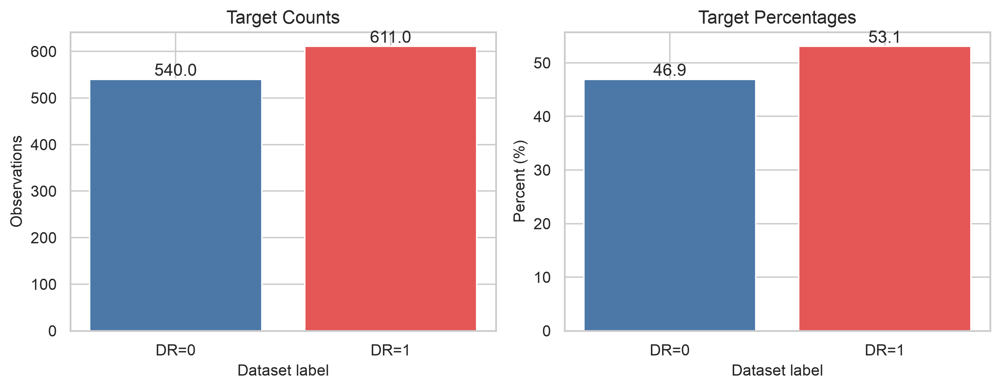

In [8]:
counts = y.value_counts().sort_index()
percentages = 100 * y.value_counts(normalize=True).sort_index()
target_summary = pd.DataFrame({'count': counts, 'percentage': percentages})
display(target_summary)
display(Image(filename=str(FIGURES / '01_target_distribution.png'))) 

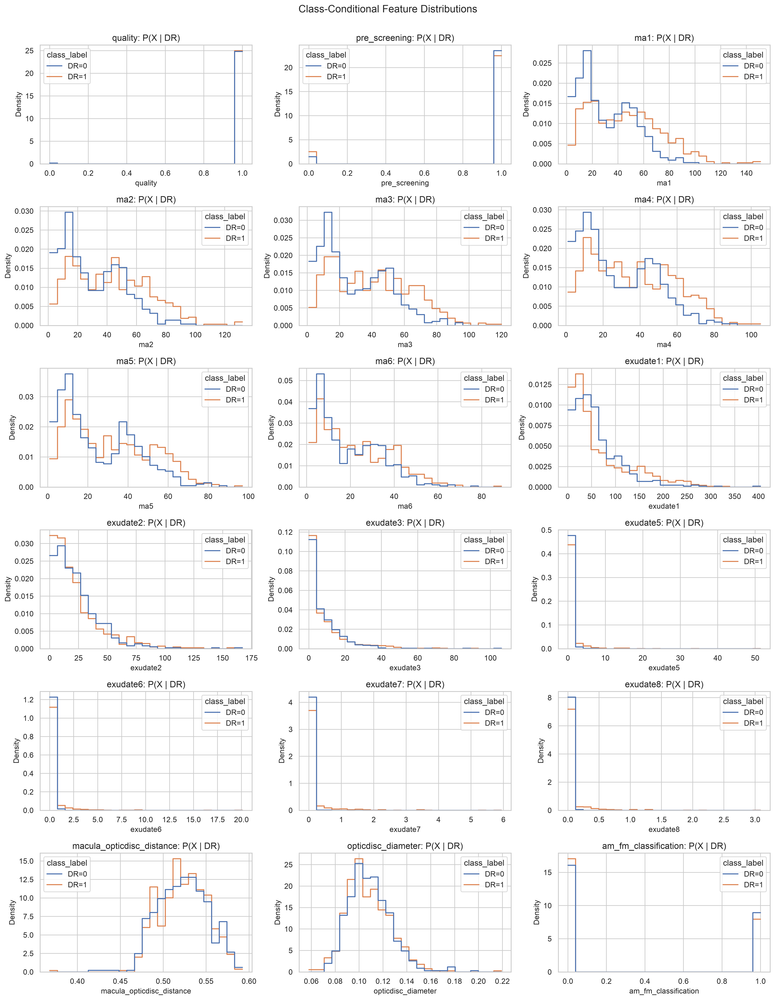

In [9]:
display(Image(filename=str(FIGURES / '02_feature_distributions.png'))) 

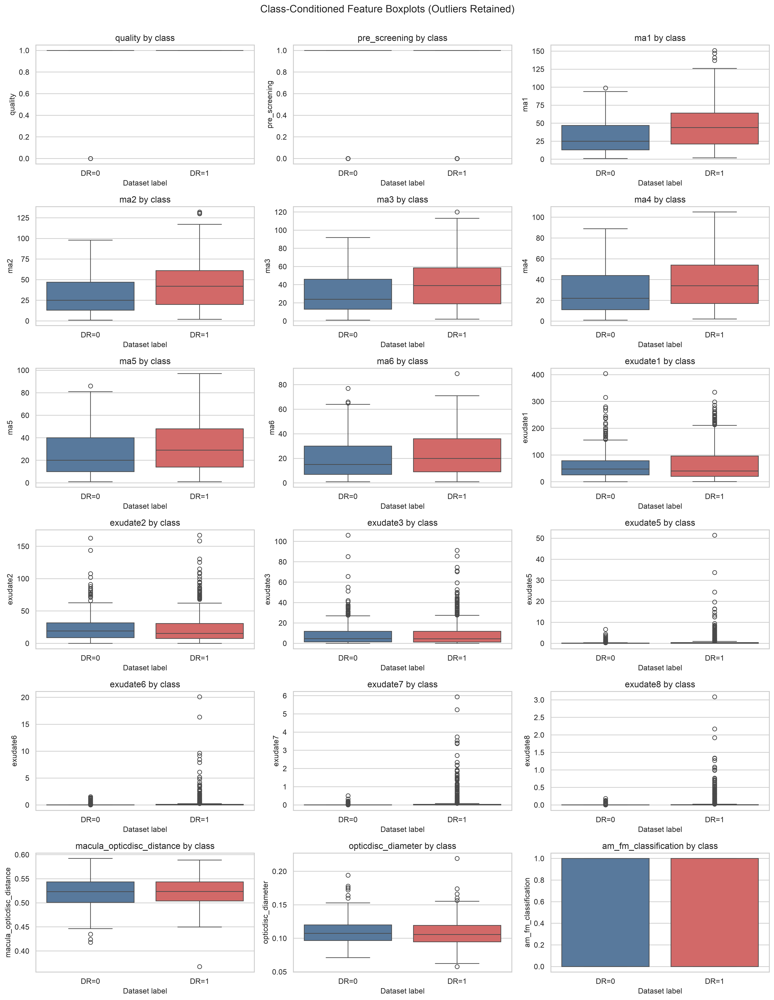

In [10]:
display(Image(filename=str(FIGURES / '03_feature_boxplots.png'))) 

## 4. Global feature relationships
Correlation is one diagnostic of association; it is not equivalent to general statistical dependence.

,feature_1,feature_2,value,absolute_value,method,class
23,ma1,ma2,0.997366,0.997366,spearman,all
24,ma2,ma3,0.996374,0.996374,spearman,all
0,ma1,ma2,0.995958,0.995958,pearson,all
1,ma2,ma3,0.995090,0.995090,pearson,all
25,ma3,ma4,0.994272,0.994272,spearman,all
2,ma3,ma4,0.992057,0.992057,pearson,all
26,ma1,ma3,0.991267,0.991267,spearman,all
27,ma4,ma5,0.991080,0.991080,spearman,all
3,ma4,ma5,0.988459,0.988459,pearson,all
4,ma1,ma3,0.986270,0.986270,pearson,all


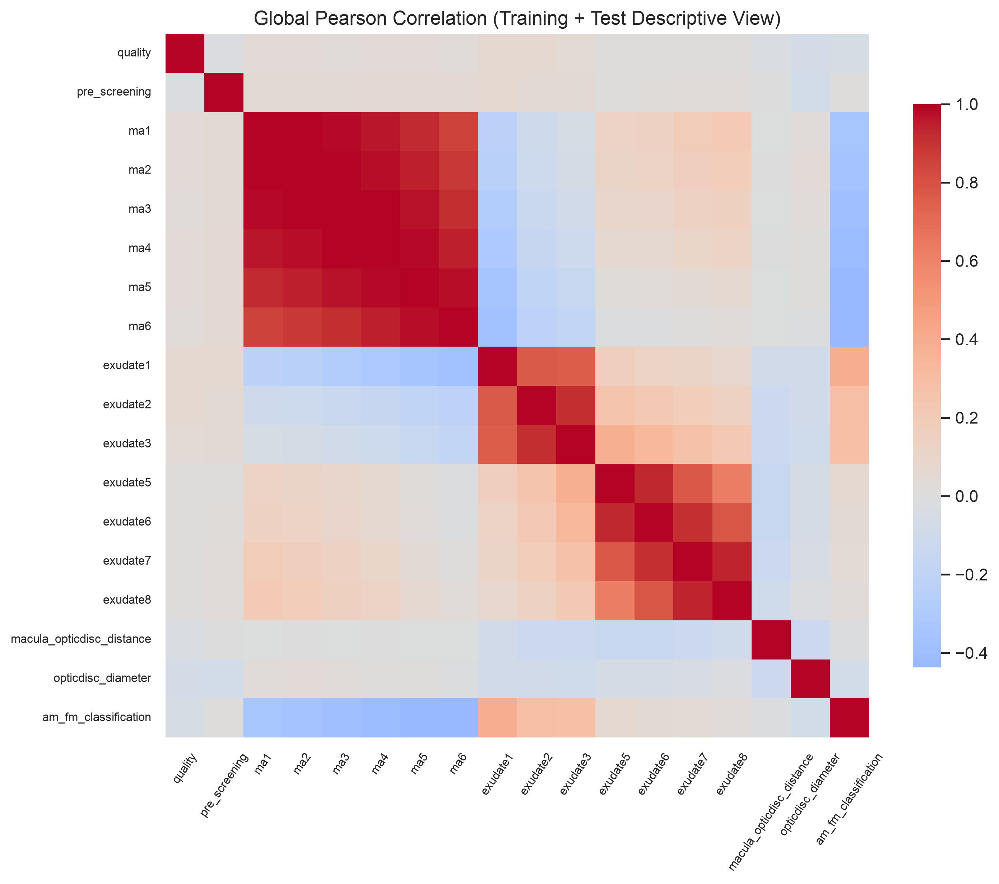

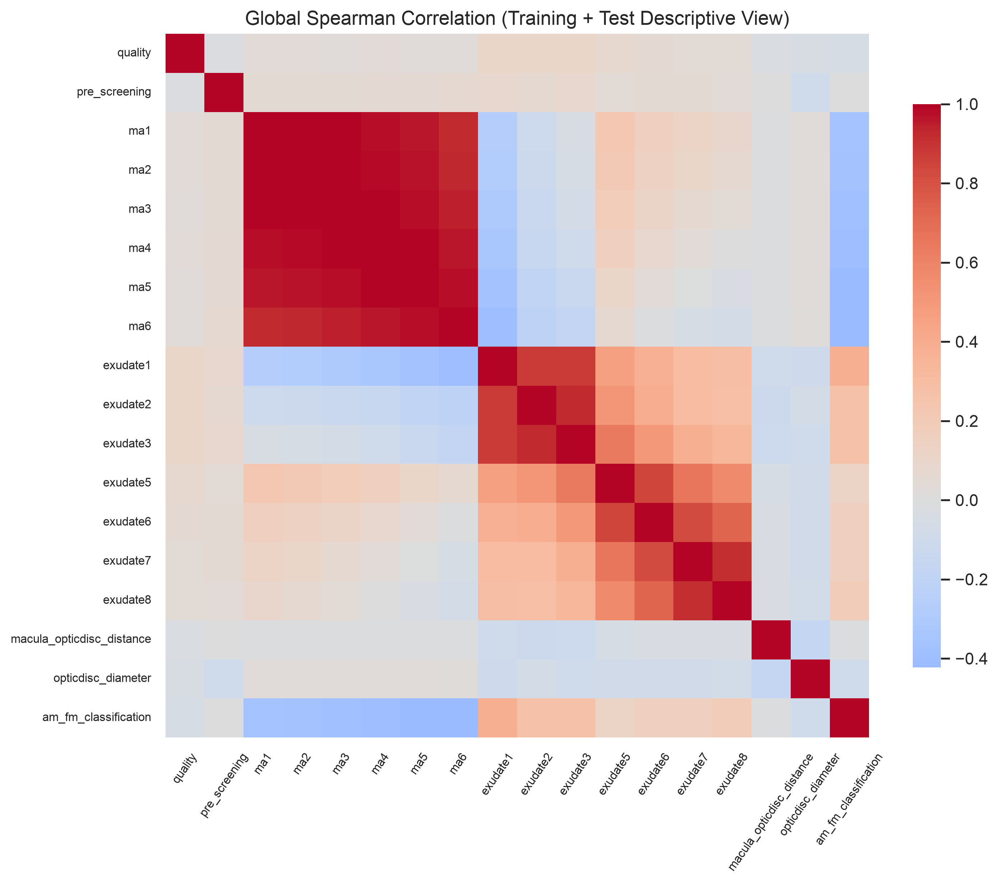

In [11]:
strong = pd.read_csv(TABLES / 'strong_correlations.csv')
display(strong.sort_values('absolute_value', ascending=False).head(15))
display(Image(filename=str(FIGURES / '04_pearson_correlation.png')))
display(Image(filename=str(FIGURES / '05_spearman_correlation.png'))) 

## 5. Leakage-safe split and class-conditional dependence
Exact duplicate feature vectors are assigned to only one side of the approximately 80/20 split.

In [12]:
split = make_split(X, y)
shared = set(map(tuple, split.X_train.to_numpy())) & set(map(tuple, split.X_test.to_numpy()))
print('Training observations:', len(split.X_train))
print('Test observations:', len(split.X_test))
print('Training class counts:', split.y_train.value_counts().sort_index().to_dict())
print('Test class counts:', split.y_test.value_counts().sort_index().to_dict())
print('Exact feature vectors shared across partitions:', len(shared))

Training observations: 920
Test observations: 231
Training class counts: {0: 432, 1: 488}
Test class counts: {0: 108, 1: 123}
Exact feature vectors shared across partitions: 0


In [13]:
conditional_dr0 = pd.read_csv(TABLES / 'conditional_correlations_DR0.csv')
conditional_dr1 = pd.read_csv(TABLES / 'conditional_correlations_DR1.csv')
print('Strongest conditional relationships — DR=0')
display(conditional_dr0.sort_values('absolute_value', ascending=False).head(10))
print('Strongest conditional relationships — DR=1')
display(conditional_dr1.sort_values('absolute_value', ascending=False).head(10))

Strongest conditional relationships — DR=0


,feature_1,feature_2,value,absolute_value,method,class
0,ma1,ma2,0.999581,0.999581,pearson,0
153,ma1,ma2,0.999367,0.999367,spearman,0
1,ma2,ma3,0.999150,0.999150,pearson,0
154,ma2,ma3,0.998927,0.998927,spearman,0
2,ma1,ma3,0.998641,0.998641,pearson,0
155,ma1,ma3,0.998113,0.998113,spearman,0
3,ma3,ma4,0.997624,0.997624,pearson,0
156,ma3,ma4,0.997215,0.997215,spearman,0
4,ma2,ma4,0.996150,0.996150,pearson,0
157,ma2,ma4,0.995673,0.995673,spearman,0


Strongest conditional relationships — DR=1


,feature_1,feature_2,value,absolute_value,method,class
153,ma1,ma2,0.995932,0.995932,spearman,1
0,ma1,ma2,0.994782,0.994782,pearson,1
154,ma2,ma3,0.994679,0.994679,spearman,1
1,ma2,ma3,0.993284,0.993284,pearson,1
155,ma3,ma4,0.991680,0.991680,spearman,1
2,ma3,ma4,0.989046,0.989046,pearson,1
156,ma4,ma5,0.988034,0.988034,spearman,1
157,ma1,ma3,0.987395,0.987395,spearman,1
3,ma4,ma5,0.984359,0.984359,pearson,1
4,ma1,ma3,0.982580,0.982580,pearson,1


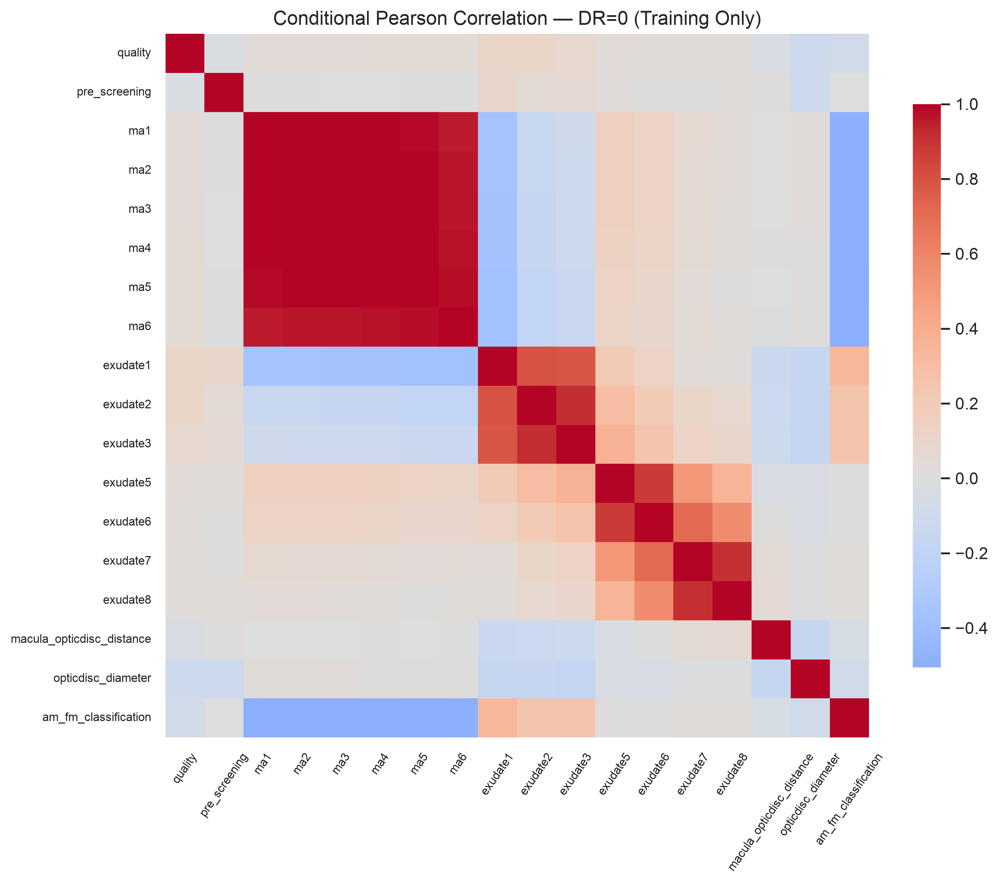

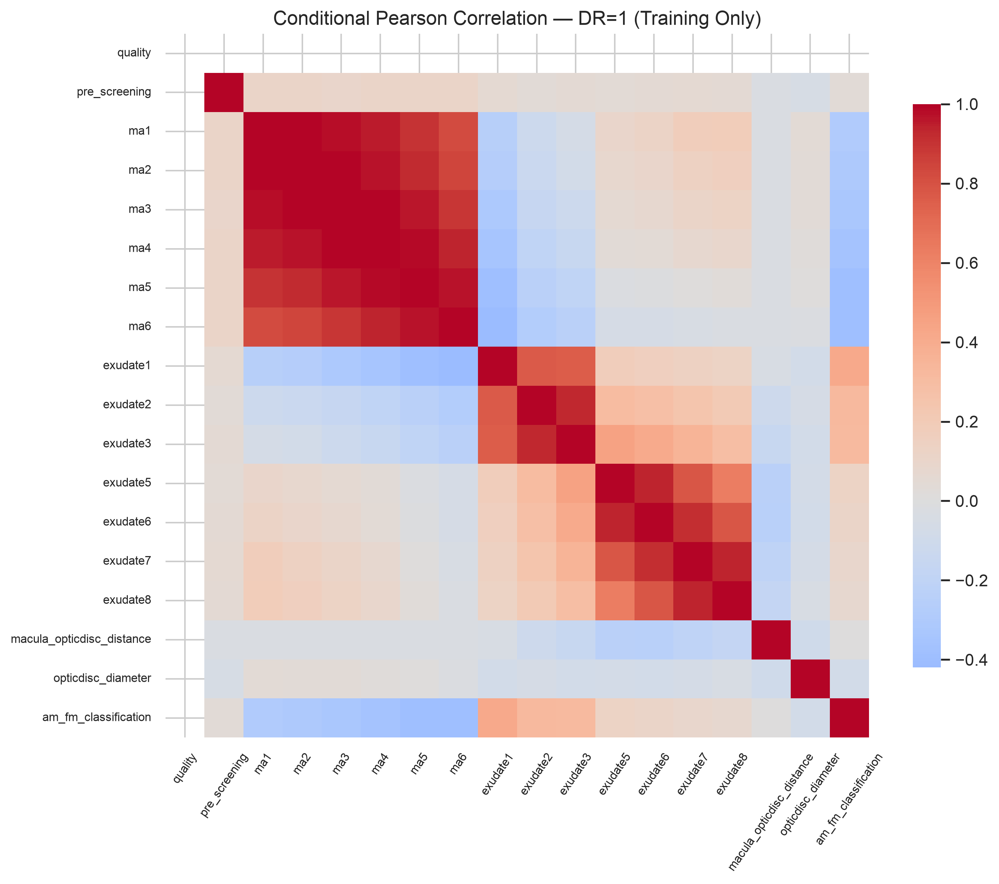

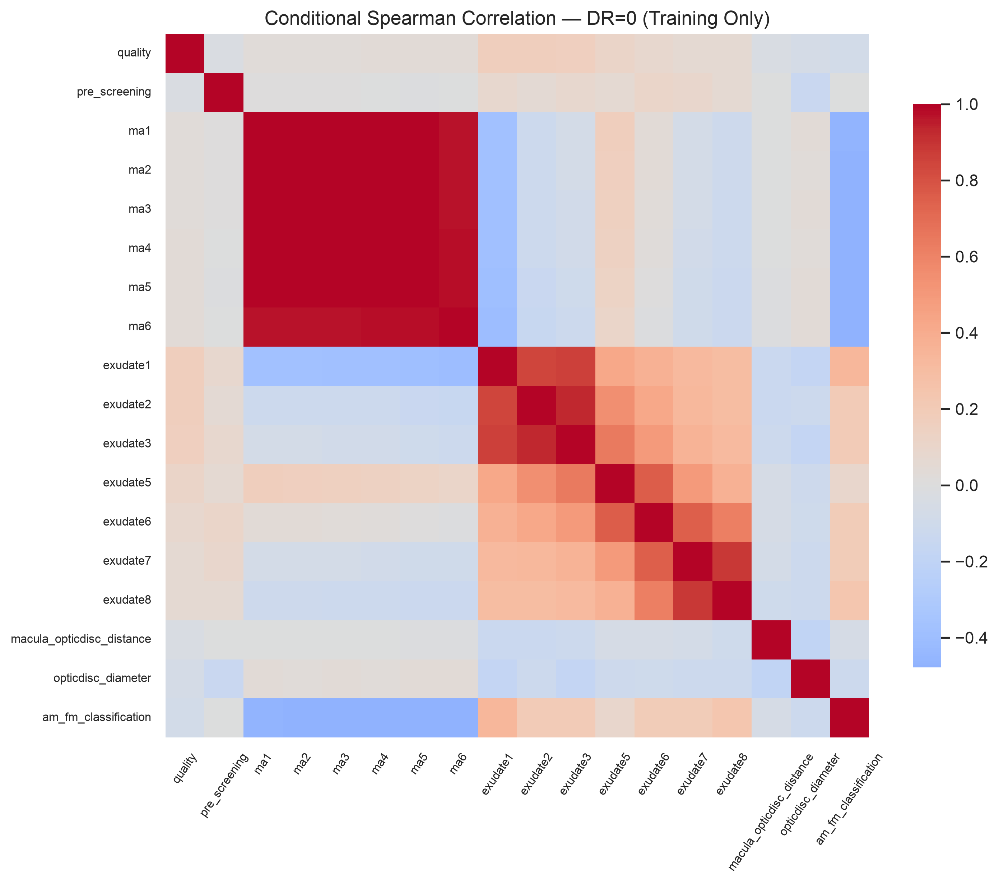

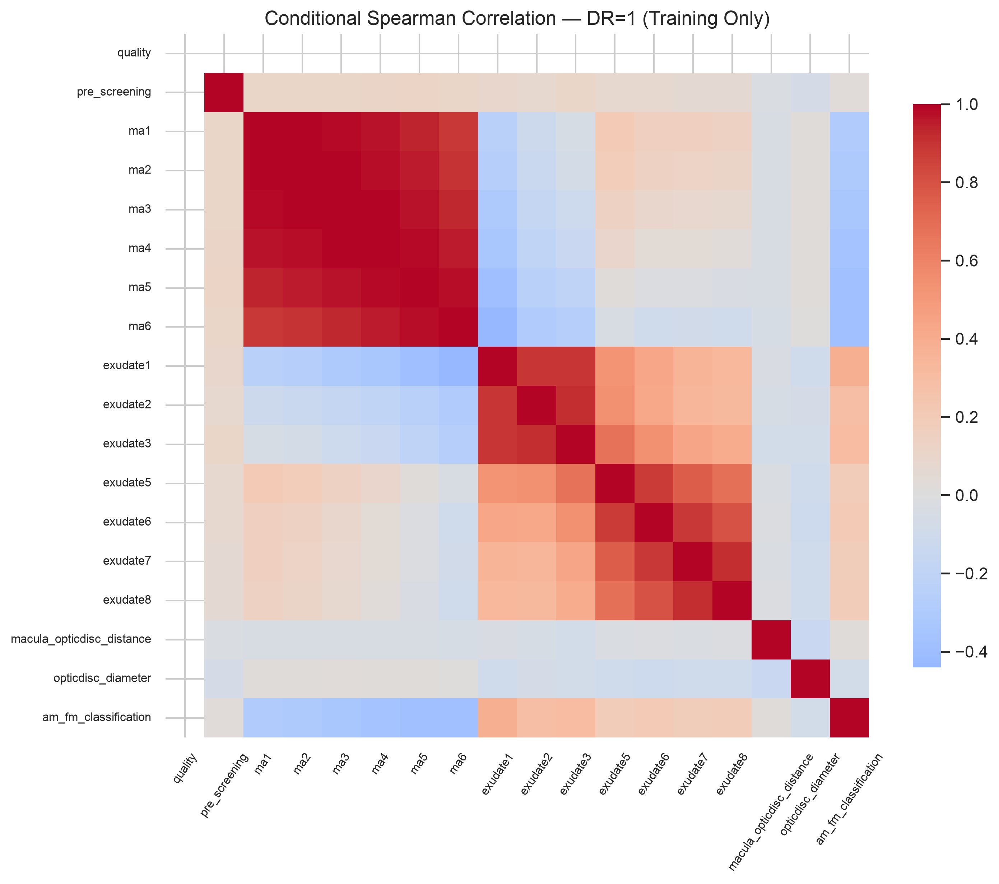

In [14]:
display(Image(filename=str(FIGURES / '06_conditional_pearson_DR0.png')))
display(Image(filename=str(FIGURES / '07_conditional_pearson_DR1.png')))
display(Image(filename=str(FIGURES / '08_conditional_spearman_DR0.png')))
display(Image(filename=str(FIGURES / '09_conditional_spearman_DR1.png'))) 

Mutual information with target (training only)


,feature,mutual_information
0,exudate7,0.069606
1,ma1,0.064781
2,ma2,0.058296
3,exudate8,0.052911
4,ma5,0.027427
5,exudate6,0.026995
6,ma3,0.023163
7,ma6,0.020013
8,exudate1,0.015104
9,exudate5,0.013559


Data-driven dependence groups (training only)


,feature,dependence_score,dependence_group,selection_source
0,quality,0.031952,LOW_DEPENDENCE,training_data_only
1,pre_screening,0.038065,LOW_DEPENDENCE,training_data_only
2,macula_opticdisc_distance,0.040795,LOW_DEPENDENCE,training_data_only
3,opticdisc_diameter,0.050464,LOW_DEPENDENCE,training_data_only
4,exudate8,0.164757,LOW_DEPENDENCE,training_data_only
5,am_fm_classification,0.171736,LOW_DEPENDENCE,training_data_only
6,exudate7,0.181434,MEDIUM_DEPENDENCE,training_data_only
7,exudate6,0.191101,MEDIUM_DEPENDENCE,training_data_only
8,exudate5,0.194200,MEDIUM_DEPENDENCE,training_data_only
9,exudate2,0.206046,MEDIUM_DEPENDENCE,training_data_only


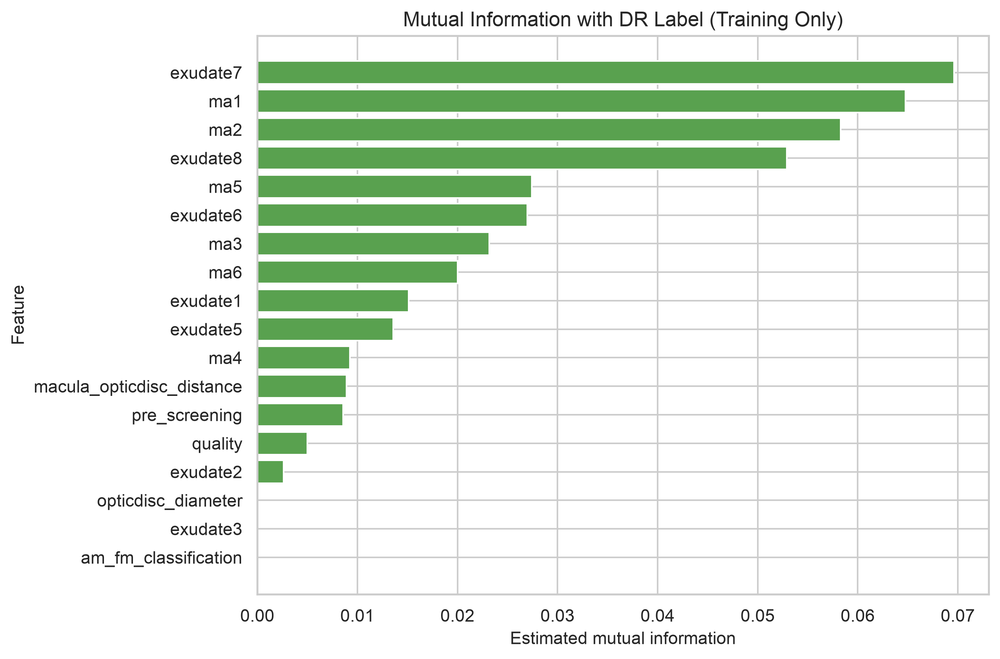

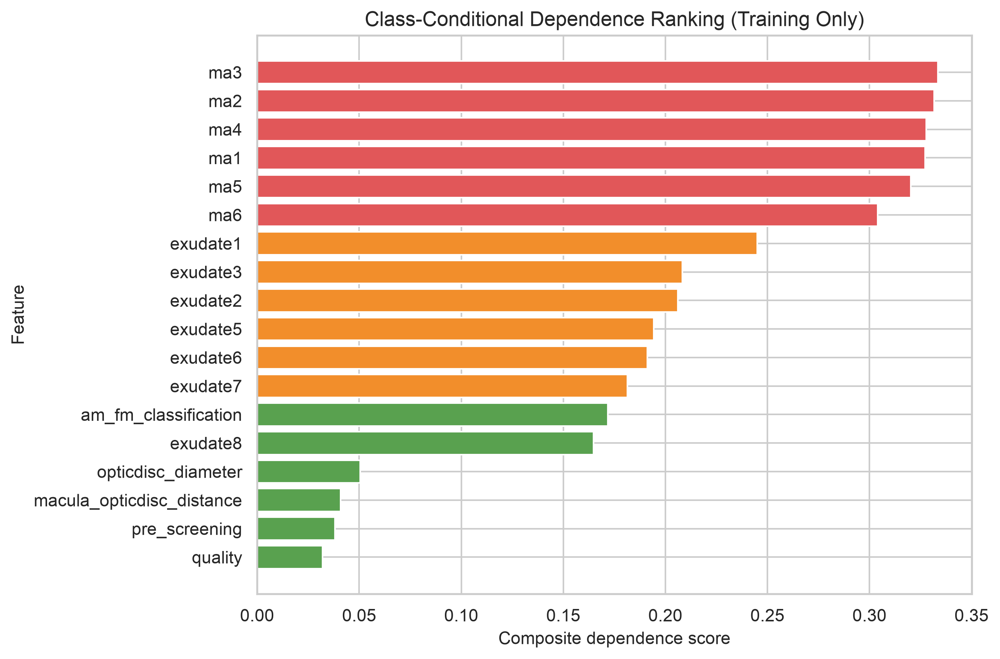

In [15]:
mi = pd.read_csv(TABLES / 'mutual_information.csv')
groups = pd.read_csv(TABLES / 'dependence_groups.csv')
print('Mutual information with target (training only)')
display(mi)
print('Data-driven dependence groups (training only)')
display(groups)
display(Image(filename=str(FIGURES / '10_mutual_information.png')))
display(Image(filename=str(FIGURES / '11_dependence_ranking.png'))) 

## 6. Gaussian Naive Bayes dependence experiment

,experiment,n_features,accuracy,precision,recall_sensitivity,specificity,f1,roc_auc
0,ALL_FEATURES,18,0.632035,0.895833,0.349593,0.953704,0.502924,0.733213
1,LOW_DEPENDENCE,6,0.532468,0.532468,1.000000,0.000000,0.694915,0.668662
2,MEDIUM_DEPENDENCE,6,0.584416,0.909091,0.243902,0.972222,0.384615,0.680894
3,HIGH_DEPENDENCE,6,0.597403,0.663043,0.495935,0.712963,0.567442,0.658235


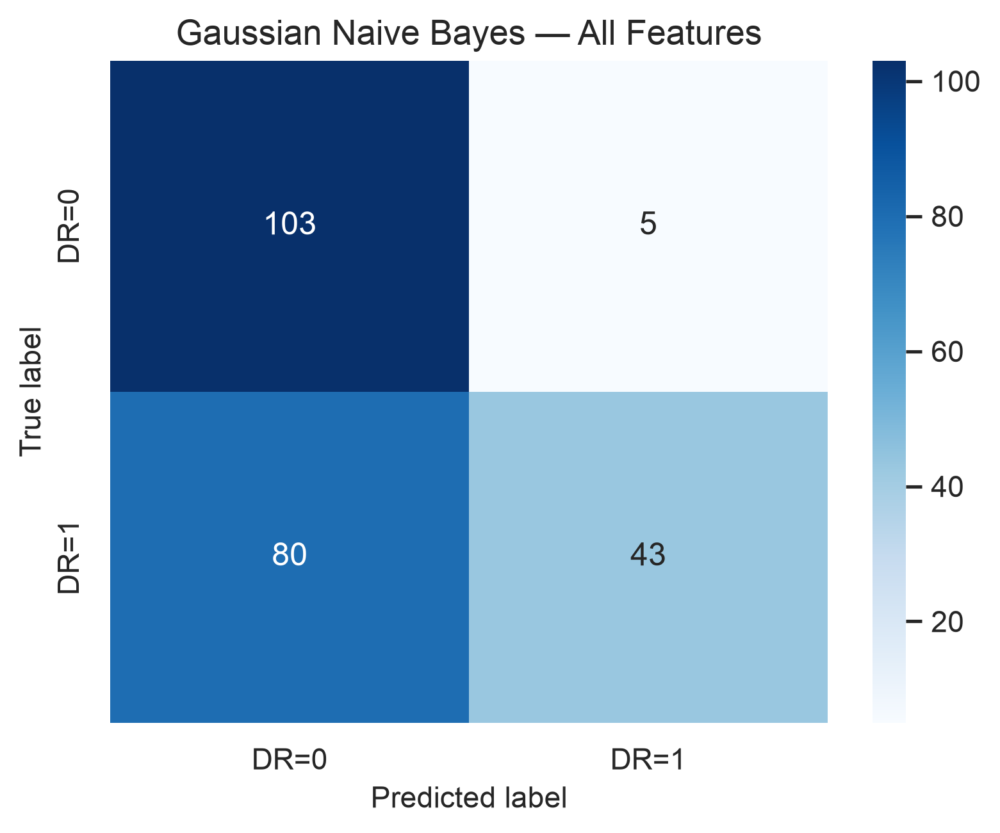

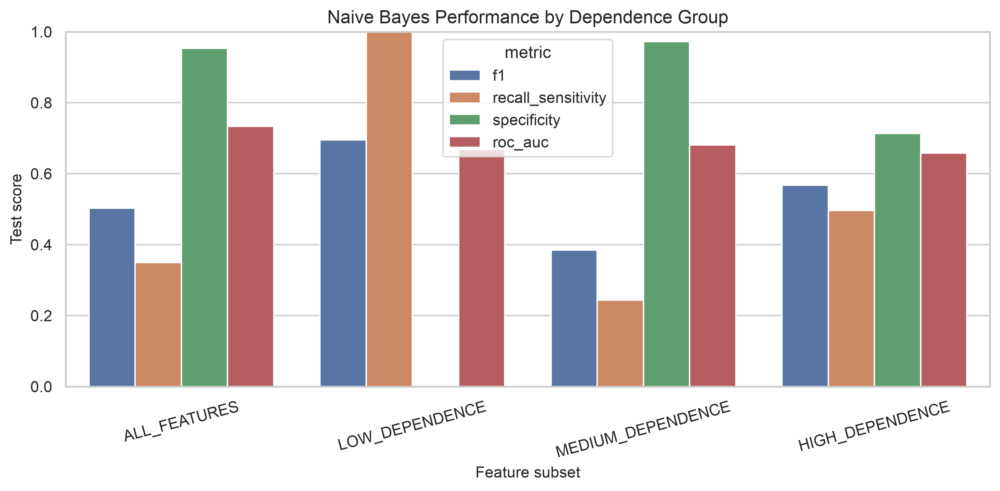

In [16]:
nb_results = pd.read_csv(TABLES / 'naive_bayes_comparison.csv')
display(nb_results[['experiment', 'n_features', 'accuracy', 'precision', 'recall_sensitivity', 'specificity', 'f1', 'roc_auc']])
display(Image(filename=str(FIGURES / '12_nb_confusion_matrix.png')))
display(Image(filename=str(FIGURES / '13_nb_dependence_comparison.png'))) 

## 7. Kernel trick and SVM results

,x,z,explicit_mapped_dot_product,polynomial_kernel_result,absolute_difference
0,"[1.0, 2.0]","[3.0, -1.0]",1.0000,1.0000,1.776357e-15
1,"[0.5, -2.0]","[1.5, 4.0]",52.5625,52.5625,0.000000e+00
2,"[-1.2, 0.7]","[2.1, -3.0]",21.3444,21.3444,7.105427e-15


Maximum mapping error: 7.105e-15


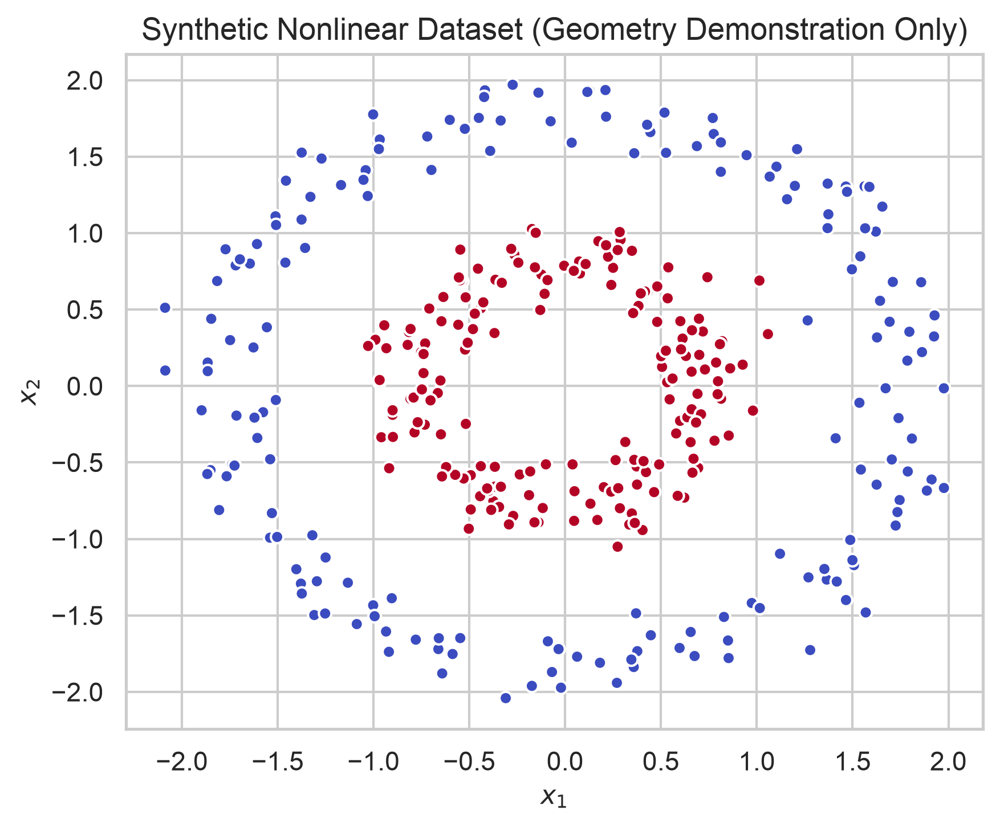

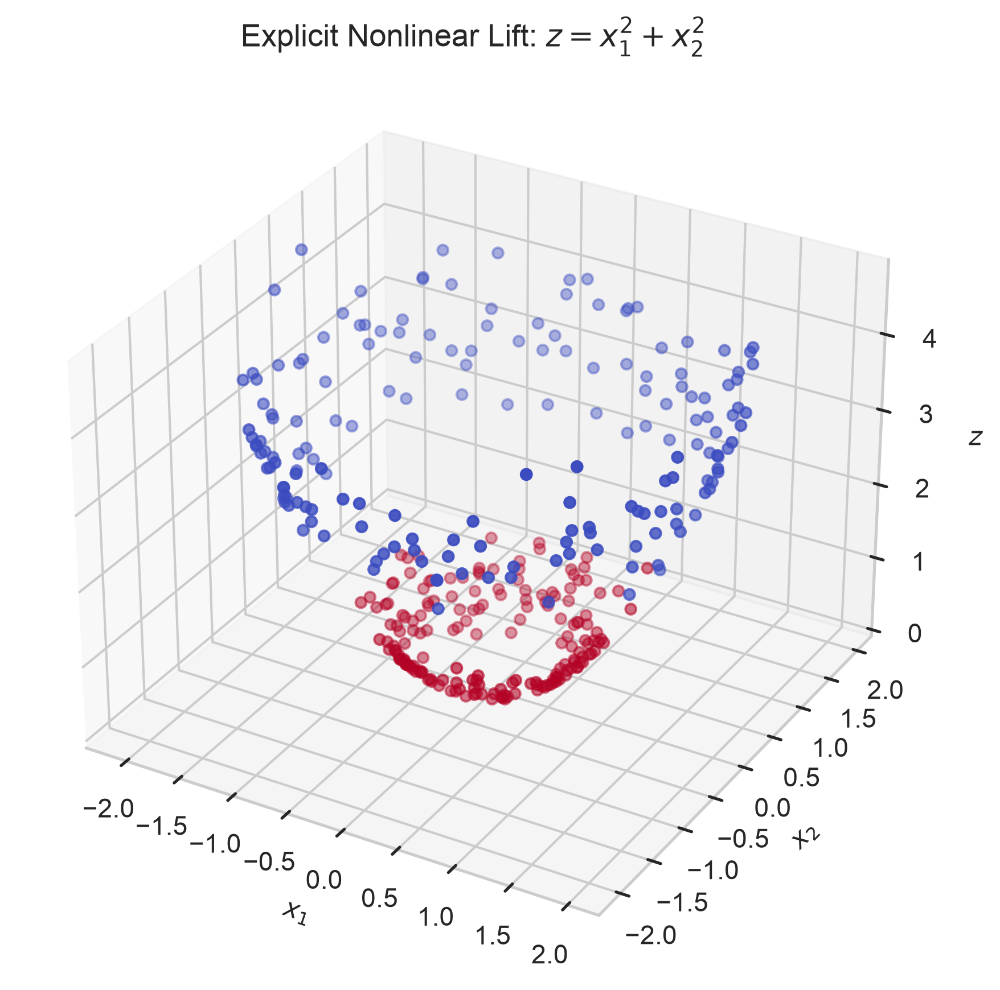

In [17]:
mapping = pd.read_csv(TABLES / 'explicit_mapping_verification.csv')
display(mapping)
print(f"Maximum mapping error: {mapping['absolute_difference'].max():.3e}")
display(Image(filename=str(FIGURES / '16_synthetic_nonlinear_dataset.png')))
display(Image(filename=str(FIGURES / '17_explicit_mapping_3d.png'))) 

Gram-matrix validation


,kernel,symmetry_max_abs_error,minimum_eigenvalue,negative_eigenvalues_below_minus_1e-8,maximum_eigenvalue
0,Linear,0.0,-5.099589e-13,0,2031.388528
1,Polynomial,0.0,-4.460212e-13,0,3336.320876
2,RBF,0.0,-5.411702e-17,0,72.855012


Same-class versus different-class similarity


,kernel,mean_same_class_similarity,mean_different_class_similarity,difference
0,Linear,0.490365,-0.516632,1.006998
1,Polynomial,1.740836,1.410984,0.329852
2,RBF,0.202284,0.193391,0.008893


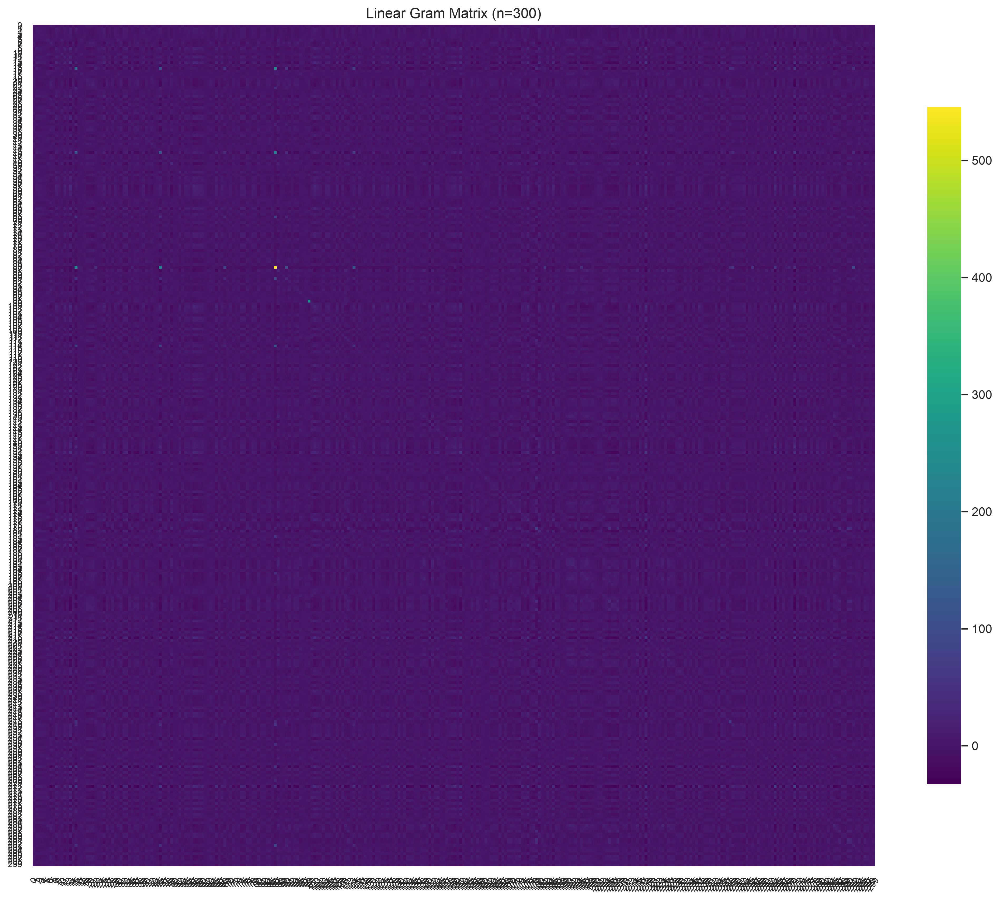

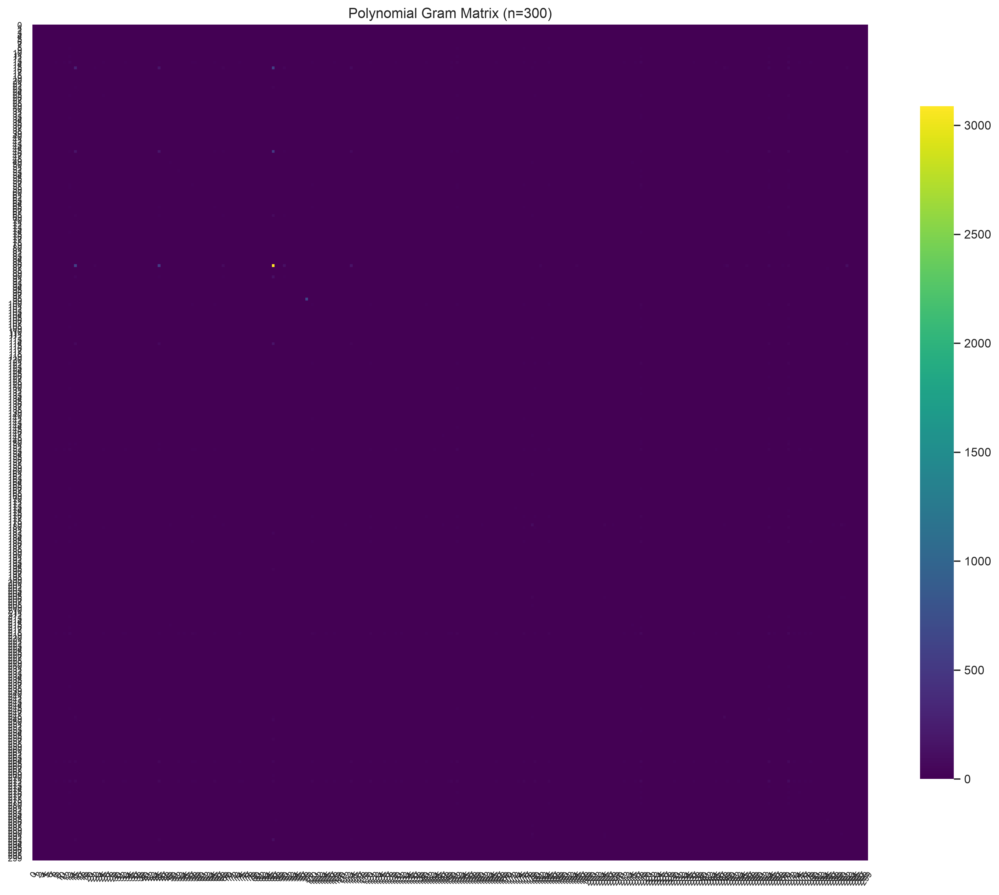

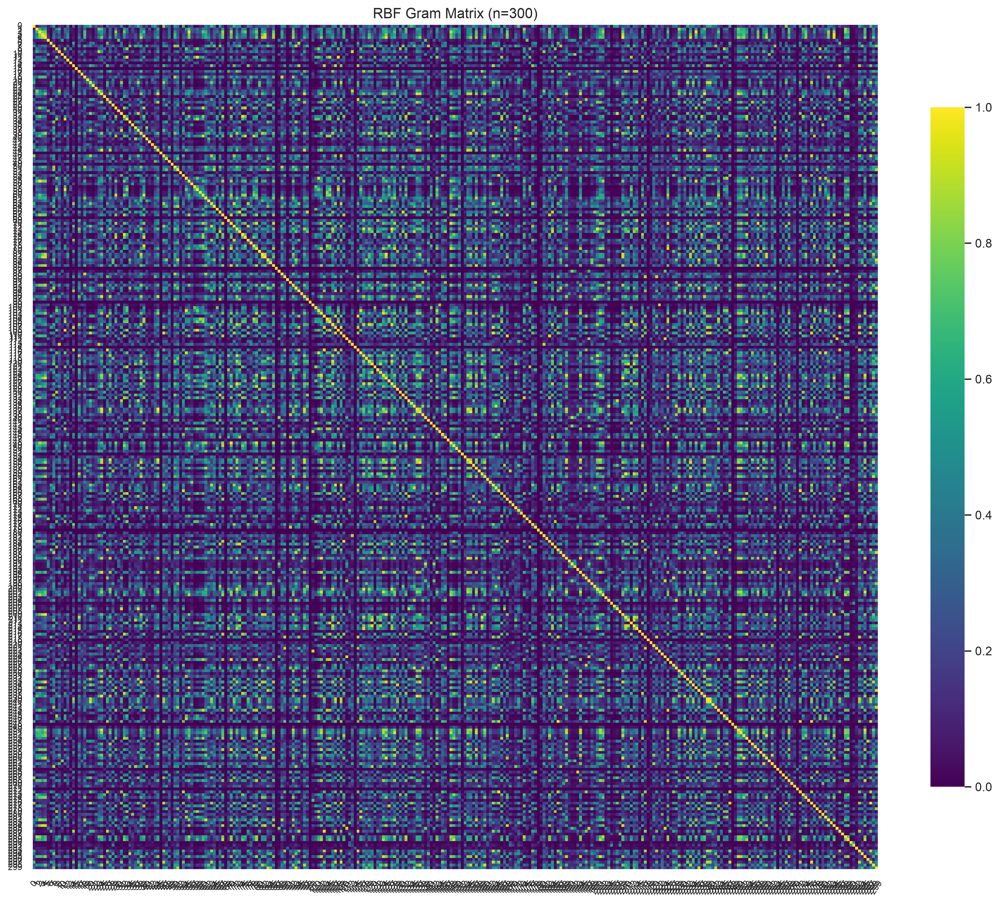

In [18]:
gram = pd.read_csv(TABLES / 'kernel_matrix_eigenvalues.csv')
similarity = pd.read_csv(TABLES / 'kernel_similarity_analysis.csv')
print('Gram-matrix validation')
display(gram)
print('Same-class versus different-class similarity')
display(similarity)
display(Image(filename=str(FIGURES / '21_linear_kernel_matrix.png')))
display(Image(filename=str(FIGURES / '22_polynomial_kernel_matrix.png')))
display(Image(filename=str(FIGURES / '23_rbf_kernel_matrix.png'))) 

,kernel,accuracy,precision,recall_sensitivity,specificity,f1,roc_auc,support_vectors,support_vector_percent,training_time_seconds,inference_time_seconds
0,Linear,0.744589,0.820000,0.666667,0.833333,0.735426,0.846582,629,68.369565,0.017505,0.007178
1,Polynomial,0.783550,0.884211,0.682927,0.898148,0.770642,0.834688,641,69.673913,0.010149,0.003436
2,RBF,0.722944,0.792079,0.650407,0.805556,0.714286,0.818955,721,78.369565,0.008811,0.009839


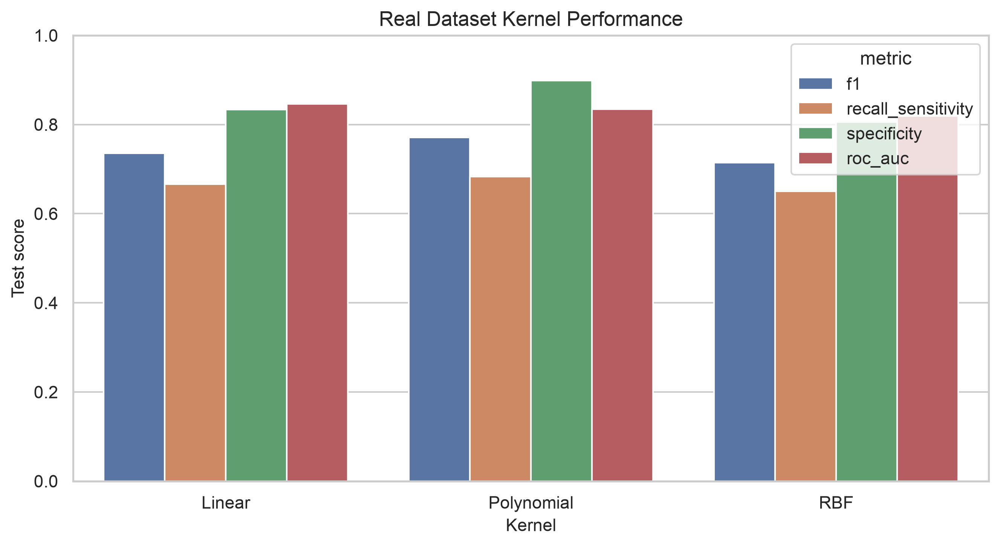

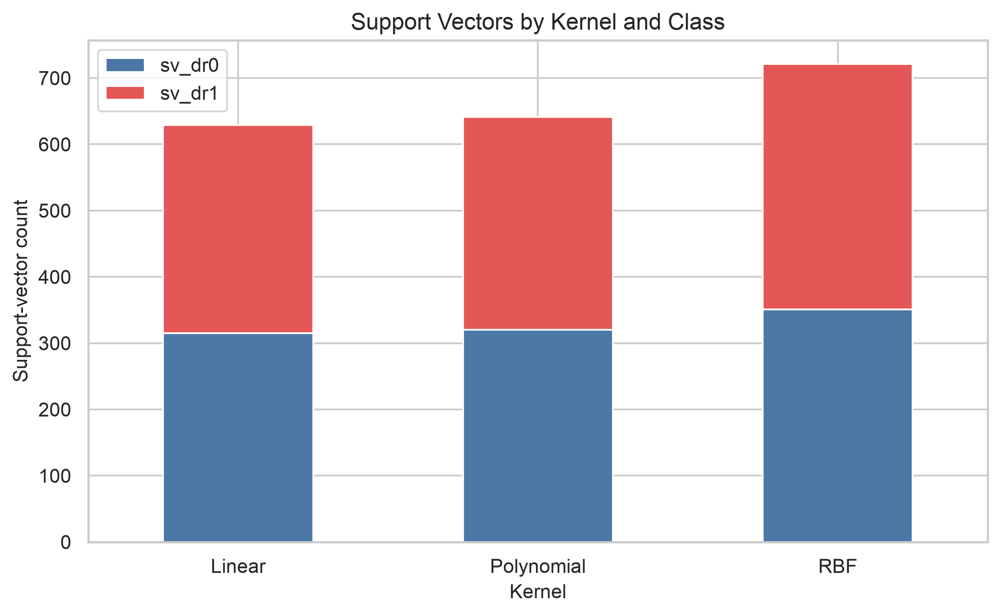

In [19]:
kernel_results = pd.read_csv(TABLES / 'kernel_baseline_comparison.csv')
display(kernel_results[['kernel', 'accuracy', 'precision', 'recall_sensitivity', 'specificity', 'f1', 'roc_auc', 'support_vectors', 'support_vector_percent', 'training_time_seconds', 'inference_time_seconds']])
display(Image(filename=str(FIGURES / '37_kernel_performance_comparison.png')))
display(Image(filename=str(FIGURES / '38_support_vector_comparison.png'))) 

Best training-CV RBF: C=100, gamma=0.01, F1=0.730, ROC-AUC=0.822
Best training-CV polynomial degree: 3, F1=0.695, ROC-AUC=0.776


,C,gamma,mean_cv_f1,std_cv_f1,mean_cv_roc_auc,std_cv_roc_auc
0,0.1,0.001,0.693178,0.002275,0.651315,0.028144
1,0.1,0.010,0.621553,0.042174,0.649037,0.031036
2,0.1,0.100,0.667793,0.028347,0.684971,0.037998
3,0.1,1.000,0.693178,0.002275,0.644198,0.027752
4,1.0,0.001,0.587713,0.030280,0.655230,0.026781
5,1.0,0.010,0.667284,0.037860,0.719911,0.035687
6,1.0,0.100,0.692867,0.048495,0.752473,0.031384
7,1.0,1.000,0.665980,0.014701,0.627048,0.035836
8,10.0,0.001,0.652139,0.045183,0.713910,0.031966
9,10.0,0.010,0.689869,0.034315,0.784688,0.028186


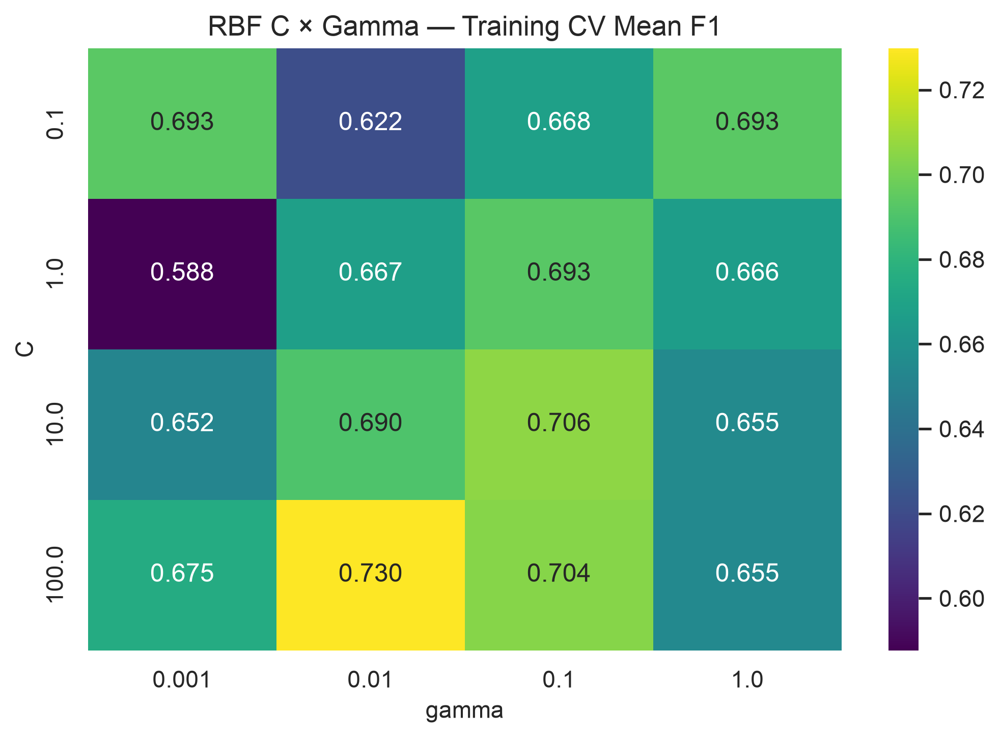

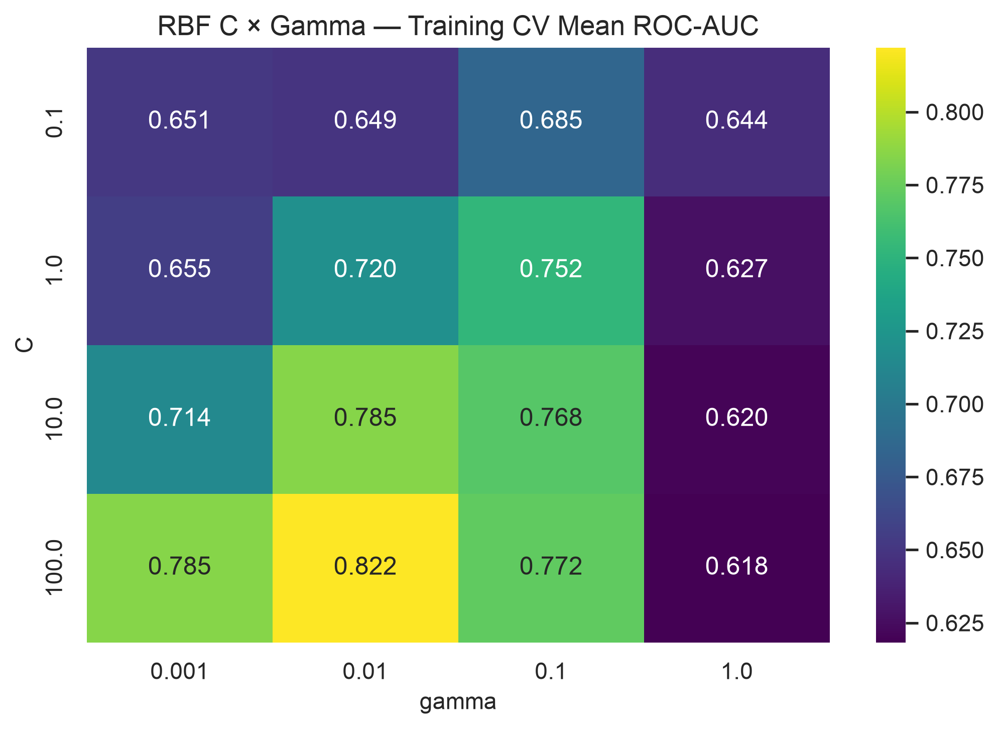

In [20]:
cv = pd.read_csv(TABLES / 'C_gamma_cross_validation.csv')
degree = pd.read_csv(TABLES / 'polynomial_degree_analysis.csv')
best_rbf = cv.loc[cv['mean_cv_f1'].idxmax()]
best_degree = degree.loc[degree['mean_cv_f1'].idxmax()]
print(f"Best training-CV RBF: C={best_rbf['C']:g}, gamma={best_rbf['gamma']:g}, F1={best_rbf['mean_cv_f1']:.3f}, ROC-AUC={best_rbf['mean_cv_roc_auc']:.3f}")
print(f"Best training-CV polynomial degree: {int(best_degree['degree'])}, F1={best_degree['mean_cv_f1']:.3f}, ROC-AUC={best_degree['mean_cv_roc_auc']:.3f}")
display(cv)
display(Image(filename=str(FIGURES / '35_C_gamma_F1_heatmap.png')))
display(Image(filename=str(FIGURES / '36_C_gamma_ROCAUC_heatmap.png'))) 

In [21]:
precomputed = pd.read_csv(TABLES / 'precomputed_kernel_comparison.csv')
display(precomputed)
print('The precomputed experiment demonstrates that SVC can operate directly on pairwise kernel similarities.')

,accuracy,precision,recall_sensitivity,specificity,f1,roc_auc,tn,fp,fn,tp,gamma,prediction_agreement,max_abs_decision_difference,support_vectors_precomputed,support_vectors_direct,training_time_seconds,inference_time_seconds
0,0.722944,0.792079,0.650407,0.805556,0.714286,0.818955,87,21,43,80,0.055556,1.0,1.061373e-13,721,721,0.002848,0.001214


The precomputed experiment demonstrates that SVC can operate directly on pairwise kernel similarities.


## 8. PCA feature-space geometry

PCA is used only for visualization. Overlap in two principal components is not proof that the complete feature space is nonlinearly separable.

,component,explained_variance_ratio,cumulative_explained_variance_ratio
0,PC1,0.349256,0.349256
1,PC2,0.226359,0.575614


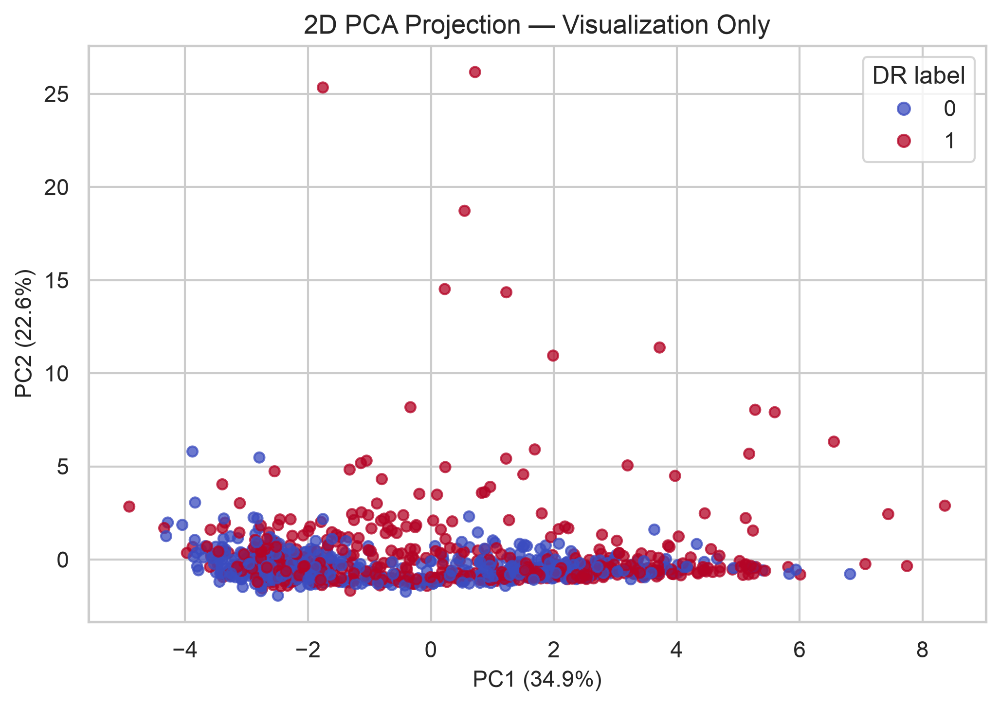

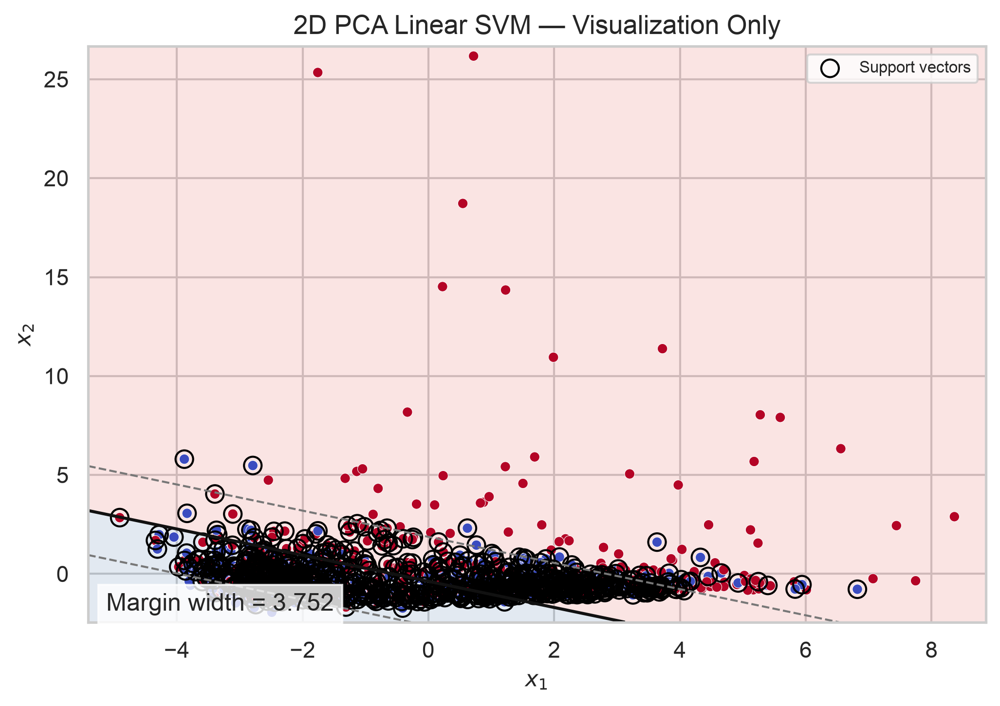

In [22]:
pca_variance = pd.read_csv(TABLES / 'pca_explained_variance.csv')
display(pca_variance)
display(Image(filename=str(FIGURES / '14_pca_feature_geometry.png')))
display(Image(filename=str(FIGURES / '15_linear_svm_pca.png')))

## 9. Synthetic nonlinear geometry and decision boundaries

The synthetic dataset isolates the geometric effect of kernel choice; it is not part of the real DR performance evaluation.

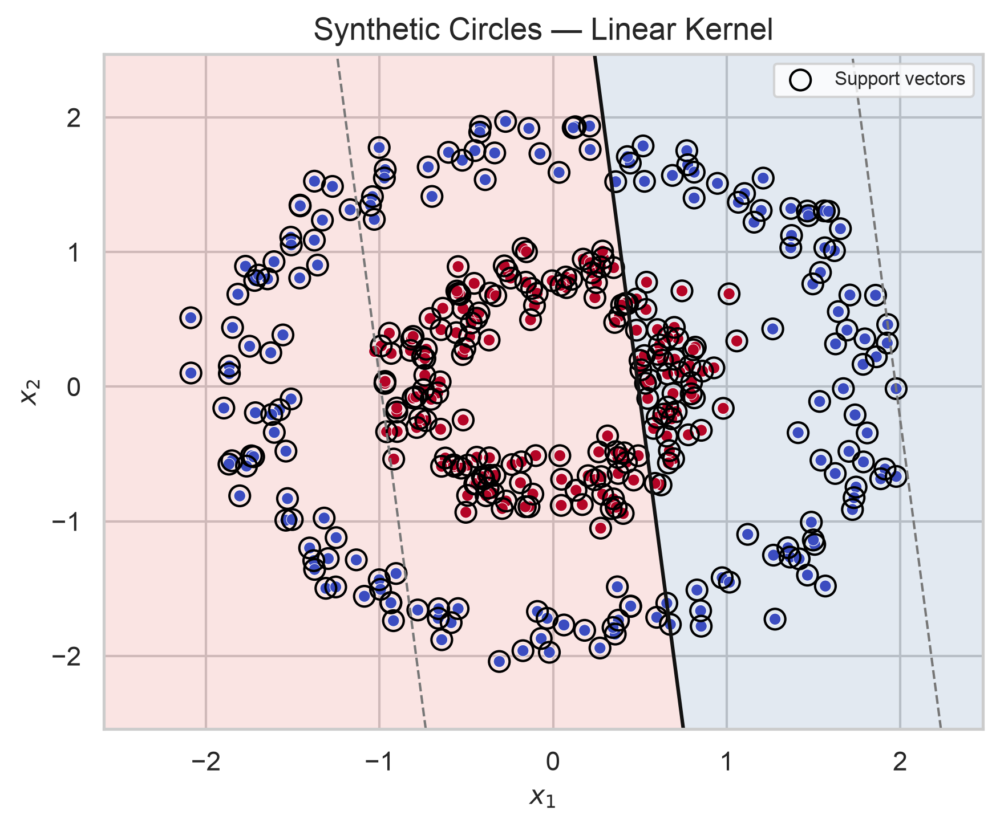

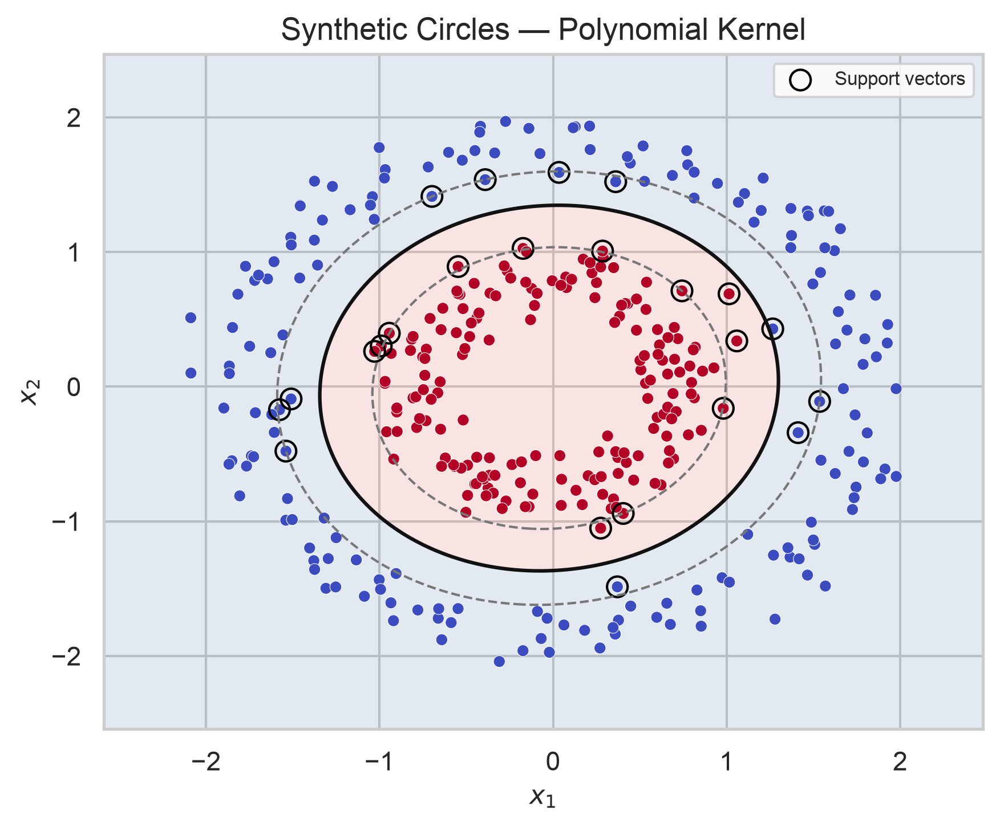

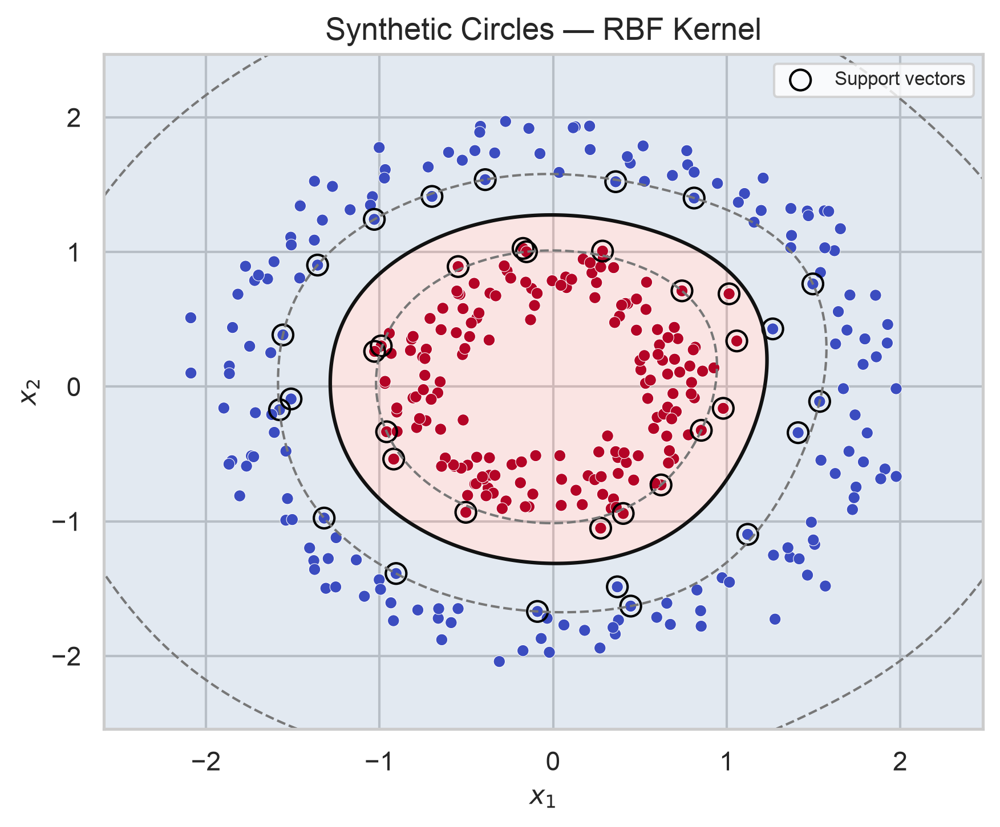

In [23]:
for filename in [
    '18_synthetic_linear_boundary.png',
    '19_synthetic_polynomial_boundary.png',
    '20_synthetic_rbf_boundary.png',
]:
    display(Image(filename=str(FIGURES / filename)))

## 10. Class-sorted kernel similarity structure

,kernel,mean_same_class_similarity,mean_different_class_similarity,difference
0,Linear,0.490365,-0.516632,1.006998
1,Polynomial,1.740836,1.410984,0.329852
2,RBF,0.202284,0.193391,0.008893


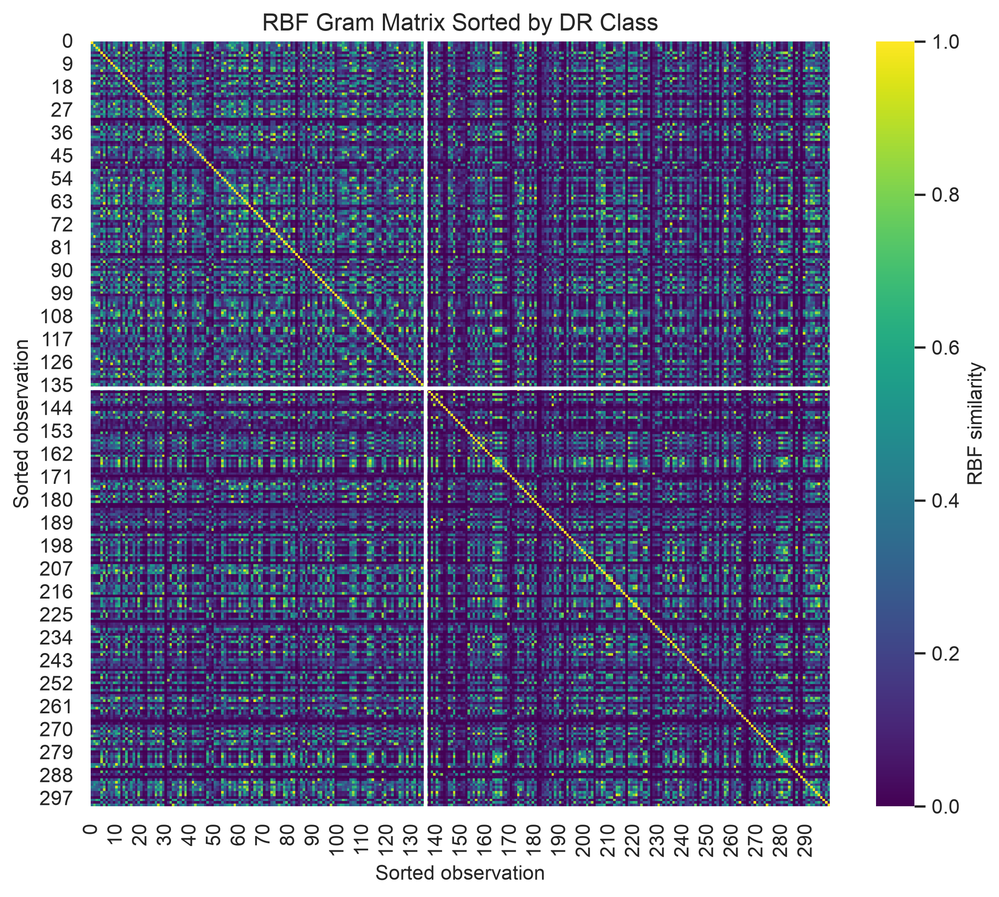

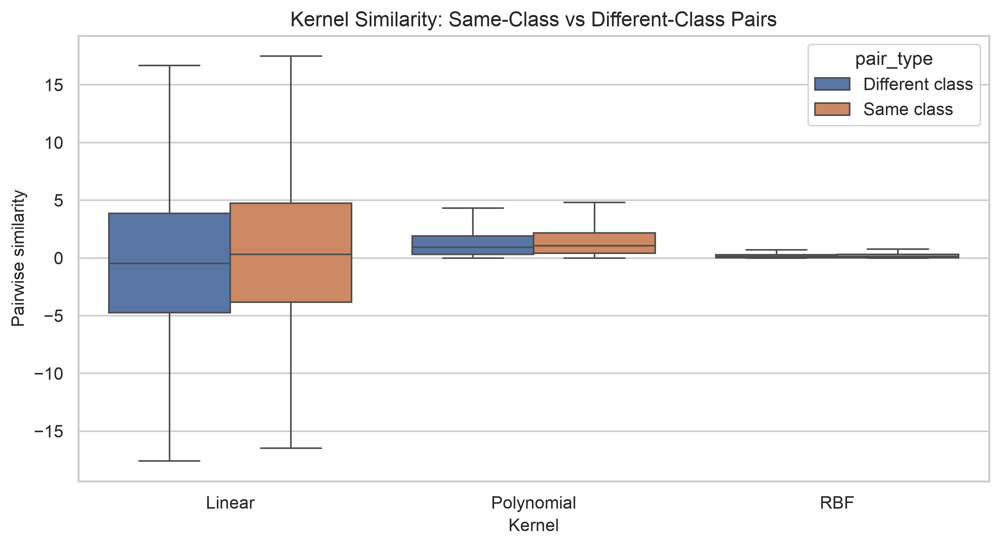

In [24]:
similarity = pd.read_csv(TABLES / 'kernel_similarity_analysis.csv')
display(similarity)
display(Image(filename=str(FIGURES / '24_rbf_kernel_sorted_by_class.png')))
display(Image(filename=str(FIGURES / '25_kernel_similarity_comparison.png')))

## 11. Linear and nonlinear boundaries on the PCA projection

These boundaries are fitted in the two-dimensional visualization projection and are not the full-dimensional models used for the reported test metrics.

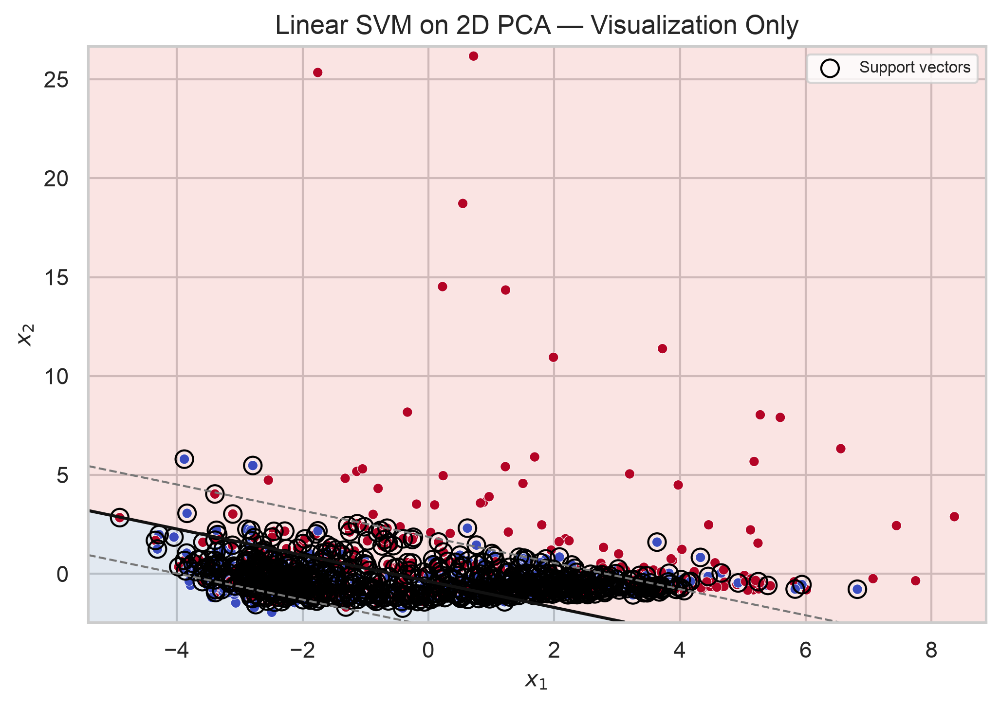

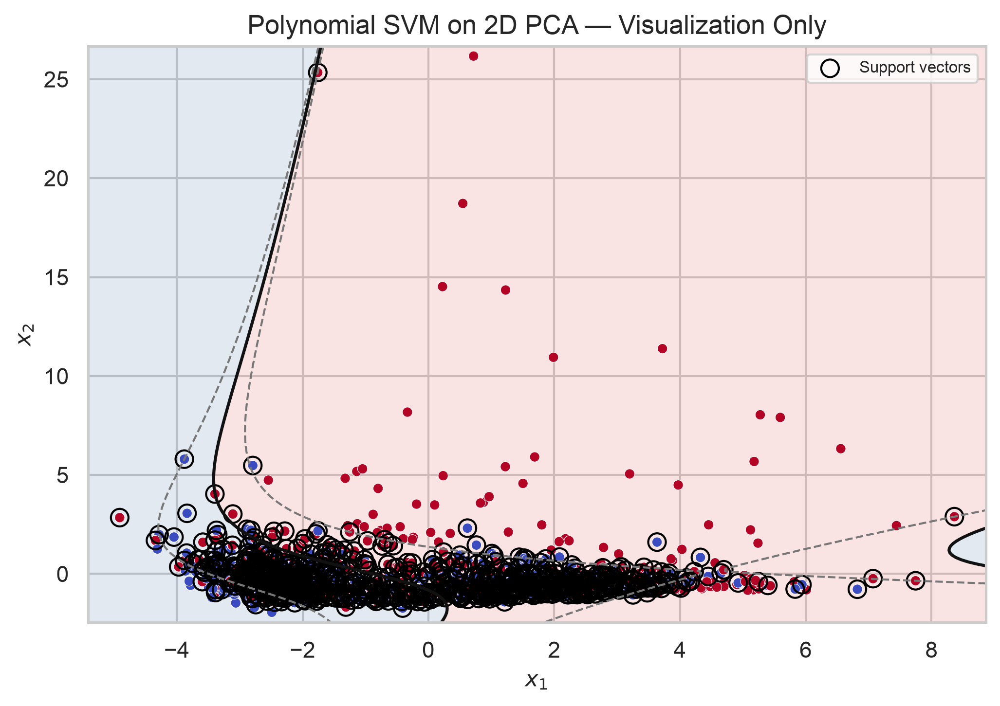

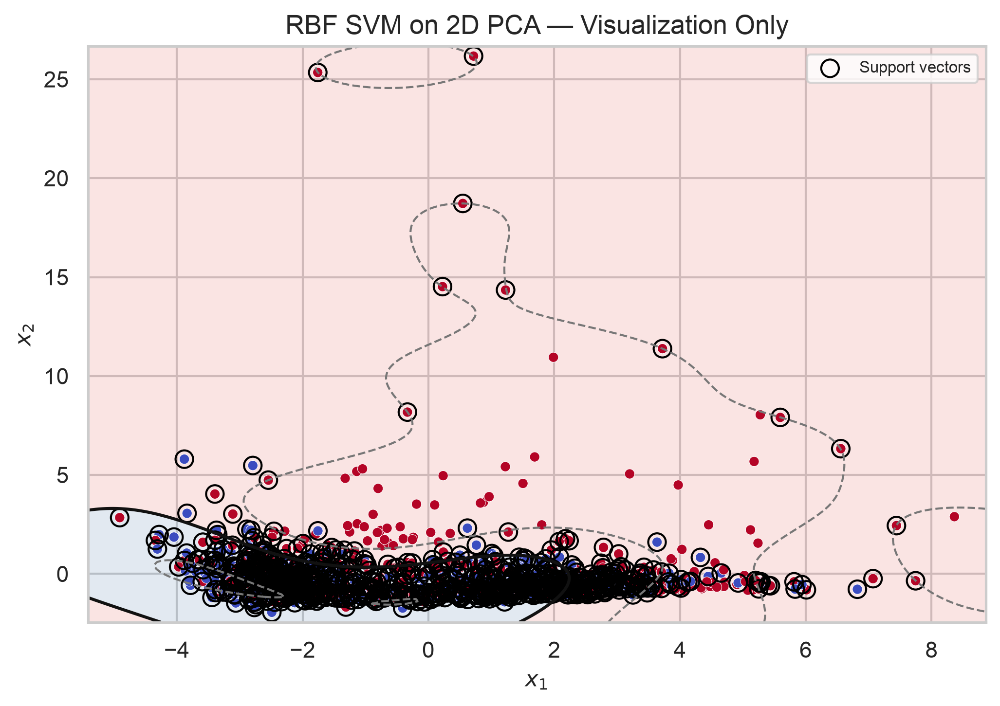

In [25]:
for filename in [
    '26_linear_svm_boundary.png',
    '27_polynomial_svm_boundary.png',
    '28_rbf_svm_boundary.png',
]:
    display(Image(filename=str(FIGURES / filename)))

## 12. RBF gamma sensitivity

Small gamma gives broad influence and smoother behavior; large gamma gives local influence. Train/test gaps, not appearance alone, provide evidence about overfitting.

,gamma,train_accuracy,accuracy,precision,recall_sensitivity,specificity,train_f1,f1,train_roc_auc,roc_auc,support_vectors,training_time_seconds
0,0.001,0.586957,0.632035,0.682692,0.577236,0.694444,0.591398,0.625551,0.664081,0.710479,839,0.009292
1,0.010,0.683696,0.714286,0.776699,0.650407,0.787037,0.680571,0.707965,0.748273,0.780638,772,0.008319
2,0.100,0.758696,0.740260,0.805825,0.674797,0.814815,0.752784,0.734513,0.836203,0.811954,727,0.008672
3,1.000,0.919565,0.696970,0.687943,0.788618,0.592593,0.923868,0.734848,0.977725,0.693391,874,0.011487
4,10.000,1.000000,0.567100,0.553488,0.967480,0.111111,1.000000,0.704142,1.000000,0.583107,919,0.013539


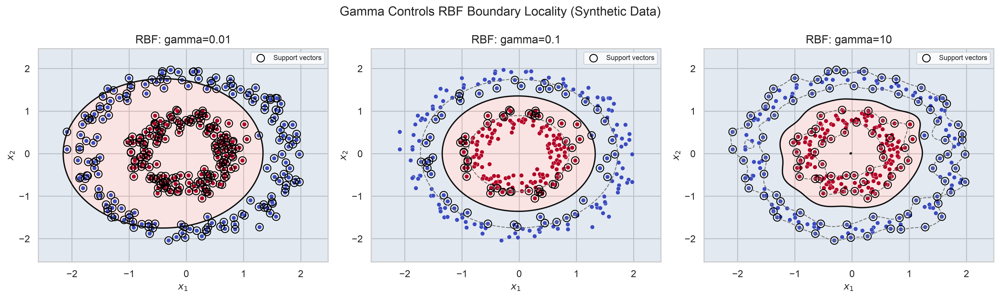

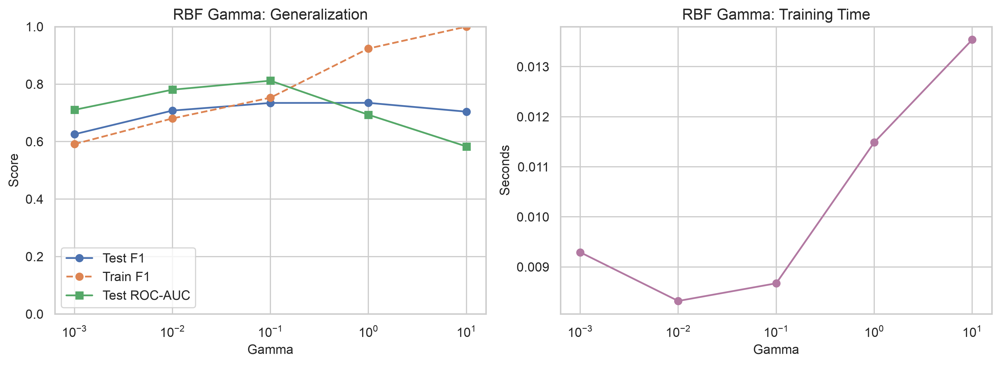

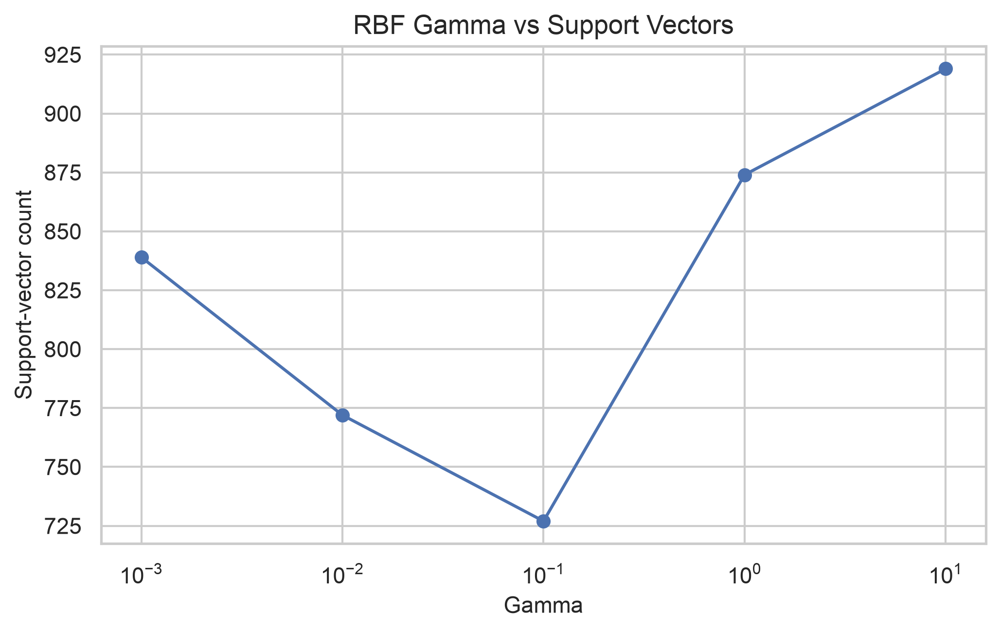

In [26]:
gamma_results = pd.read_csv(TABLES / 'gamma_analysis.csv')
display(gamma_results[[
    'gamma', 'train_accuracy', 'accuracy', 'precision', 'recall_sensitivity',
    'specificity', 'train_f1', 'f1', 'train_roc_auc', 'roc_auc',
    'support_vectors', 'training_time_seconds'
]])
display(Image(filename=str(FIGURES / '29_gamma_boundary_comparison.png')))
display(Image(filename=str(FIGURES / '30_gamma_performance.png')))
display(Image(filename=str(FIGURES / '31_gamma_support_vectors.png')))

## 13. C regularization sensitivity

Small C applies stronger regularization and tolerates more violations; large C penalizes training errors more heavily.

,C,train_accuracy,accuracy,precision,recall_sensitivity,specificity,train_f1,f1,train_roc_auc,roc_auc,support_vectors,training_time_seconds
0,0.01,0.530435,0.532468,0.532468,1.000000,0.000000,0.693182,0.694915,0.678483,0.747666,867,0.009395
1,0.10,0.646739,0.662338,0.692308,0.658537,0.666667,0.671385,0.675000,0.704705,0.767465,829,0.008887
2,1.00,0.748913,0.722944,0.792079,0.650407,0.805556,0.741899,0.714286,0.814962,0.818955,721,0.008381
3,10.00,0.806522,0.783550,0.841121,0.731707,0.842593,0.803532,0.782609,0.891156,0.825354,620,0.009714
4,100.00,0.882609,0.753247,0.779661,0.747967,0.759259,0.885835,0.763485,0.949302,0.821590,533,0.020504


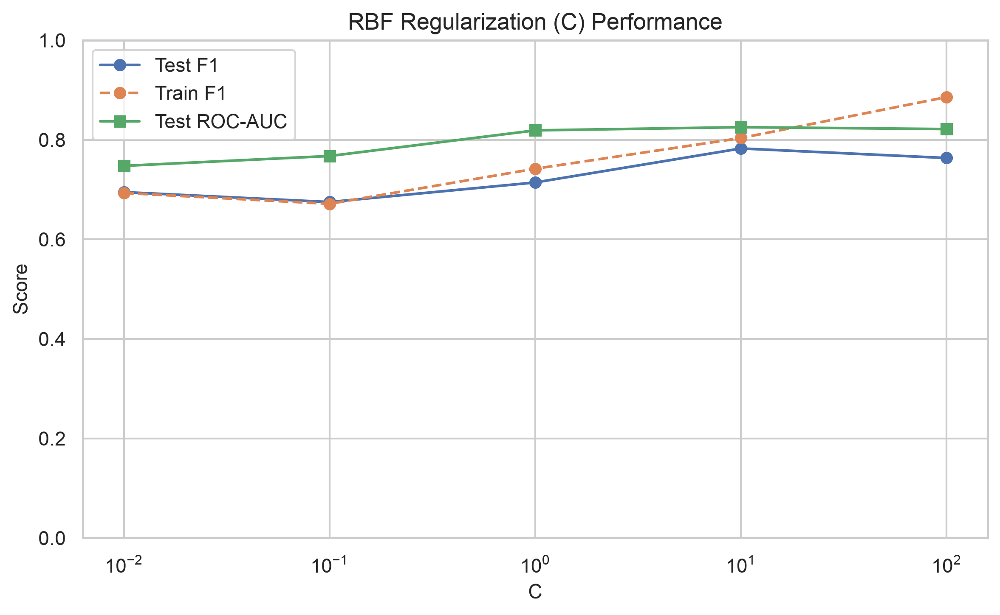

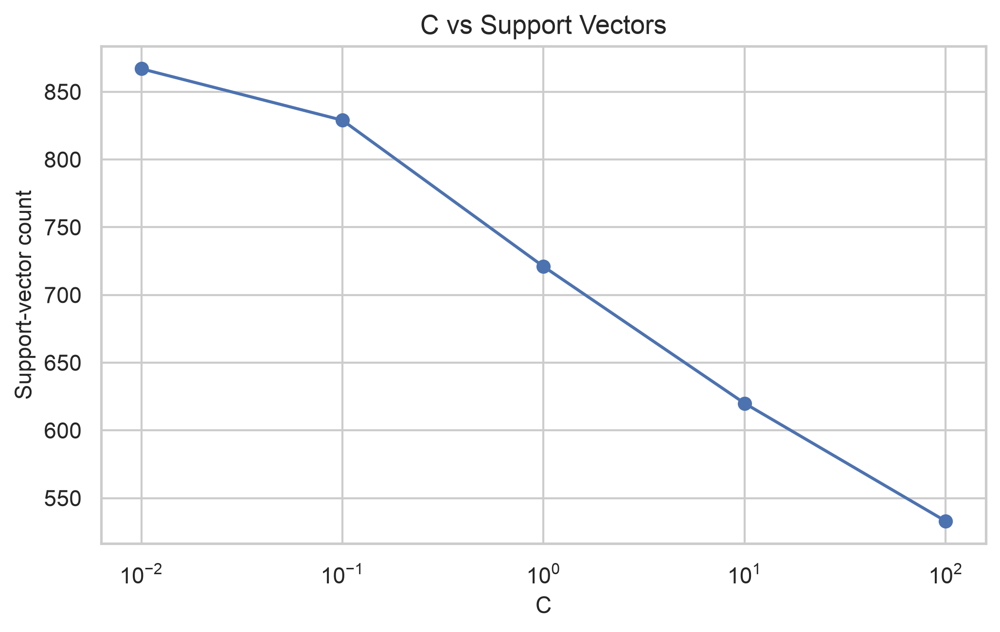

In [27]:
c_results = pd.read_csv(TABLES / 'C_analysis.csv')
display(c_results[[
    'C', 'train_accuracy', 'accuracy', 'precision', 'recall_sensitivity',
    'specificity', 'train_f1', 'f1', 'train_roc_auc', 'roc_auc',
    'support_vectors', 'training_time_seconds'
]])
display(Image(filename=str(FIGURES / '32_C_performance.png')))
display(Image(filename=str(FIGURES / '33_C_support_vectors.png')))

## 14. Polynomial degree sensitivity

Degree controls the order of implicit feature interactions. The CV columns are learned from training data only; holdout scores remain descriptive.

,degree,train_accuracy,accuracy,precision,recall_sensitivity,specificity,train_f1,f1,roc_auc,support_vectors,mean_cv_f1,std_cv_f1,mean_cv_roc_auc,std_cv_roc_auc
0,2,0.742391,0.779221,0.846154,0.715447,0.851852,0.727899,0.775330,0.826332,673,0.686883,0.032908,0.770382,0.023194
1,3,0.768478,0.783550,0.884211,0.682927,0.898148,0.752613,0.770642,0.834688,641,0.694504,0.034118,0.775766,0.021107
2,4,0.789130,0.779221,0.867347,0.691057,0.879630,0.775982,0.769231,0.833258,618,0.679956,0.031913,0.765236,0.017198
3,5,0.807609,0.800866,0.873786,0.731707,0.879630,0.799092,0.796460,0.821665,602,0.678508,0.035693,0.762133,0.020941


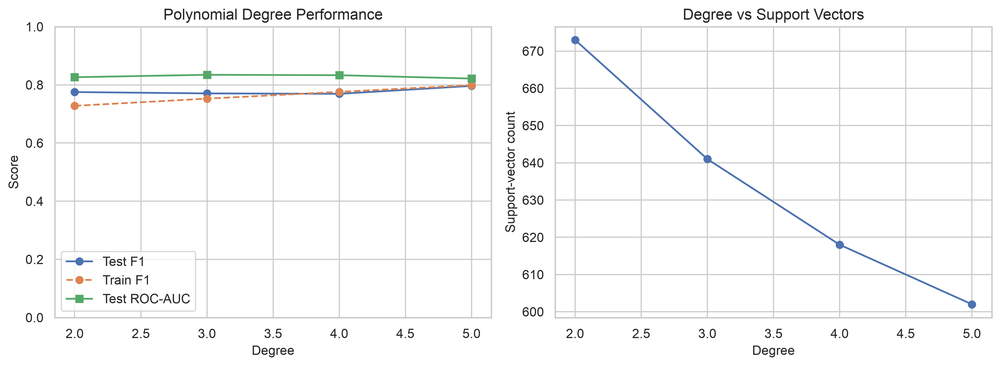

In [28]:
degree_results = pd.read_csv(TABLES / 'polynomial_degree_analysis.csv')
display(degree_results[[
    'degree', 'train_accuracy', 'accuracy', 'precision', 'recall_sensitivity',
    'specificity', 'train_f1', 'f1', 'roc_auc', 'support_vectors',
    'mean_cv_f1', 'std_cv_f1', 'mean_cv_roc_auc', 'std_cv_roc_auc'
]])
display(Image(filename=str(FIGURES / '34_polynomial_degree_analysis.png')))

## 15. Support vectors and predictive–computational trade-offs

,kernel,sv_dr0,sv_dr1,support_vectors,support_vector_percent
0,Linear,315,314,629,68.369565
1,Polynomial,320,321,641,69.673913
2,RBF,351,370,721,78.369565


,kernel,f1,roc_auc,recall_sensitivity,support_vector_percent,training_time_seconds,inference_time_seconds
0,Linear,0.735426,0.846582,0.666667,68.369565,0.017505,0.007178
1,Polynomial,0.770642,0.834688,0.682927,69.673913,0.010149,0.003436
2,RBF,0.714286,0.818955,0.650407,78.369565,0.008811,0.009839


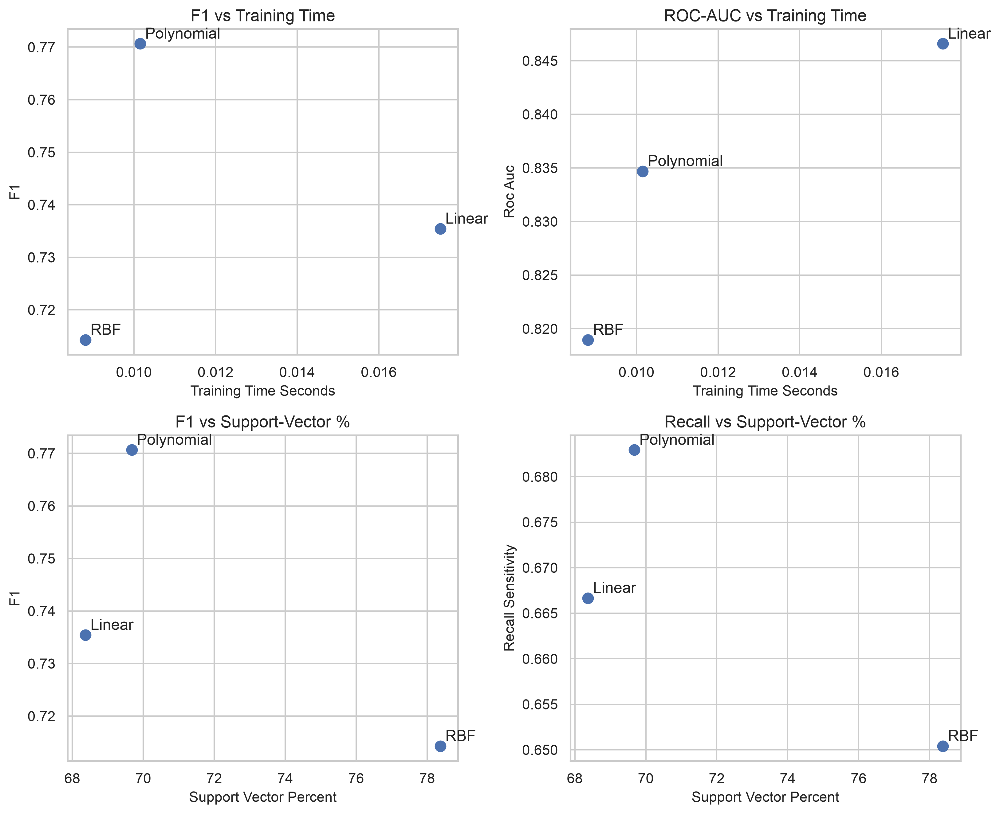

In [29]:
support_results = pd.read_csv(TABLES / 'support_vector_analysis.csv')
display(support_results)
display(kernel_results[[
    'kernel', 'f1', 'roc_auc', 'recall_sensitivity', 'support_vector_percent',
    'training_time_seconds', 'inference_time_seconds'
]])
display(Image(filename=str(FIGURES / '39_performance_vs_computation.png')))

## 16. Consolidated model comparison

In [30]:
nb_baseline = nb_results.loc[nb_results['experiment'].eq('ALL_FEATURES')].copy()
nb_baseline['model'] = 'Gaussian Naive Bayes'
svm_models = kernel_results.copy()
svm_models['model'] = svm_models['kernel'] + ' SVM'
columns = ['model', 'accuracy', 'precision', 'recall_sensitivity', 'specificity', 'f1', 'roc_auc']
comparison = pd.concat([nb_baseline[columns], svm_models[columns]], ignore_index=True)
display(comparison.round({c: 3 for c in columns[1:]}))
best_f1 = comparison.loc[comparison['f1'].idxmax()]
best_auc = comparison.loc[comparison['roc_auc'].idxmax()]
print(f"Highest holdout F1: {best_f1['model']} ({best_f1['f1']:.3f})")
print(f"Highest holdout ROC-AUC: {best_auc['model']} ({best_auc['roc_auc']:.3f})")

,model,accuracy,precision,recall_sensitivity,specificity,f1,roc_auc
0,Gaussian Naive Bayes,0.632,0.896,0.350,0.954,0.503,0.733
1,Linear SVM,0.745,0.820,0.667,0.833,0.735,0.847
2,Polynomial SVM,0.784,0.884,0.683,0.898,0.771,0.835
3,RBF SVM,0.723,0.792,0.650,0.806,0.714,0.819


Highest holdout F1: Polynomial SVM (0.771)
Highest holdout ROC-AUC: Linear SVM (0.847)


## 17. Research-question answers generated from the experimental outputs

In [31]:
top_global = strong.sort_values('absolute_value', ascending=False).iloc[0]
top_dr0 = conditional_dr0.sort_values('absolute_value', ascending=False).iloc[0]
top_dr1 = conditional_dr1.sort_values('absolute_value', ascending=False).iloc[0]
best_rbf = cv.loc[cv['mean_cv_f1'].idxmax()]
best_degree = degree_results.loc[degree_results['mean_cv_f1'].idxmax()]
print('RQ1–RQ3: Features are strongly dependent globally and conditionally.')
print(f"  Global maximum: {top_global.feature_1}–{top_global.feature_2}, {top_global.method}={top_global.value:.4f}")
print(f"  DR=0 maximum: {top_dr0.feature_1}–{top_dr0.feature_2}, {top_dr0.method}={top_dr0.value:.4f}")
print(f"  DR=1 maximum: {top_dr1.feature_1}–{top_dr1.feature_2}, {top_dr1.method}={top_dr1.value:.4f}")
print('RQ4–RQ5: Naive Bayes behavior changed substantially across dependence groups, but the effect is confounded by feature identity and information.')
print('RQ6–RQ7: The linear SVM was competitive; nonlinear flexibility did not uniformly improve every metric.')
print('RQ8–RQ9: Explicit mapping, Gram matrices, and precomputed-kernel equivalence verify similarity-space operation.')
print(f"RQ10: Training CV selected RBF C={best_rbf.C:g}, gamma={best_rbf.gamma:g}; polynomial degree={int(best_degree.degree)}.")
print('RQ11: Polynomial SVM gave the best holdout F1, while Linear SVM gave the best ROC-AUC; RBF used the most support vectors.')

RQ1–RQ3: Features are strongly dependent globally and conditionally.
  Global maximum: ma1–ma2, spearman=0.9974
  DR=0 maximum: ma1–ma2, pearson=0.9996
  DR=1 maximum: ma1–ma2, spearman=0.9959
RQ4–RQ5: Naive Bayes behavior changed substantially across dependence groups, but the effect is confounded by feature identity and information.
RQ6–RQ7: The linear SVM was competitive; nonlinear flexibility did not uniformly improve every metric.
RQ8–RQ9: Explicit mapping, Gram matrices, and precomputed-kernel equivalence verify similarity-space operation.
RQ10: Training CV selected RBF C=100, gamma=0.01; polynomial degree=3.
RQ11: Polynomial SVM gave the best holdout F1, while Linear SVM gave the best ROC-AUC; RBF used the most support vectors.


## Final limitations and presentation guidance

- Results come from one extracted-feature dataset and one grouped holdout split.
- Dependence estimates have sampling uncertainty.
- Dependence-group comparisons also change feature identity and predictive information.
- PCA figures are visualization-only.
- Timing results are specific to this machine and run.
- There is no external or clinical validation.

For a presentation, use the consolidated table and selected figures as the main narrative; retain the full notebook as the evidence-rich appendix.

## Interpretation caution
Dependence-group results are observational because feature relevance changes with feature dependence. PCA is visualization-only. Kernel-similarity alignment is exploratory evidence, not proof. No clinical conclusions should be inferred.